# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

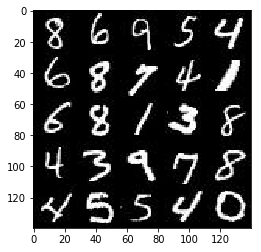

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

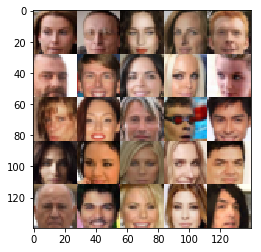

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.5.0
Default GPU Device: /device:GPU:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    
    inputs_real = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name='input_real') 
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    learning_rate = tf.placeholder(tf.float32, None, name='learning_rate')

    return inputs_real, inputs_z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
alpha = 0.01
leaky_relu = lambda x: tf.maximum(alpha * x, x)

def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    with tf.variable_scope('discriminator', reuse=reuse):
        
        
        # Input layer is 32x32x3
        x1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='same')
        relu1 = leaky_relu(x1)
        # 16x16x64
        
        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = leaky_relu(bn2)
        # 8x8x128
        
        x3 = tf.layers.conv2d(relu2, 256, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = leaky_relu(bn3)
        # 4x4x256

        # Flatten it
        flat = tf.reshape(relu3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True):
    with tf.variable_scope('generator', reuse=not is_train):
        
        x1 = tf.layers.dense(z, 7*7*512)
        x1 = tf.reshape(x1, (-1, 7, 7, 512))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = leaky_relu(x1)
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = leaky_relu(x2)
        
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = leaky_relu(x3)
        
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 5, strides=1, padding='same')
        
        out = tf.tanh(logits)
        
        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real, reuse=False)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    n_images=16
    _, img_width, img_height, img_channels = data_shape
    
    input_real, z_input, lr = model_inputs(
        img_width, img_height, img_channels, z_dim)
    
    d_loss, g_loss = model_loss(input_real, z_input, img_channels)
    d_train_opt, g_train_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    steps = 0
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                steps += 1
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                _ = sess.run(d_train_opt, feed_dict={input_real: batch_images, z_input: batch_z,lr: learning_rate})
                _ = sess.run(g_train_opt, feed_dict={input_real: batch_images,z_input: batch_z,lr: learning_rate})
            
                if steps % 50 == 0:
                    train_loss_d = sess.run(d_loss, {z_input: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({z_input: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))    
                    
                    show_generator_output(sess, n_images, z_input, img_channels, data_image_mode)
                
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 0.0006... Generator Loss: 8.0116


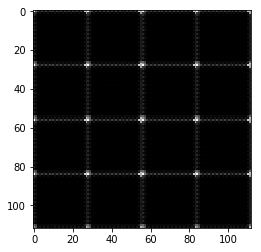

Epoch 1/2... Discriminator Loss: 0.0010... Generator Loss: 8.8379


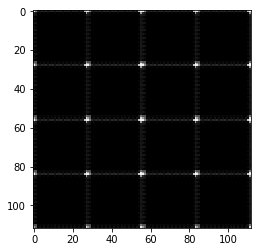

Epoch 1/2... Discriminator Loss: 0.0001... Generator Loss: 9.4131


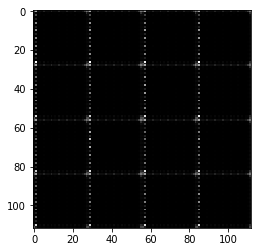

Epoch 1/2... Discriminator Loss: 0.0005... Generator Loss: 9.0660


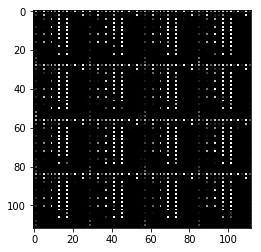

Epoch 1/2... Discriminator Loss: 1.3133... Generator Loss: 4.9172


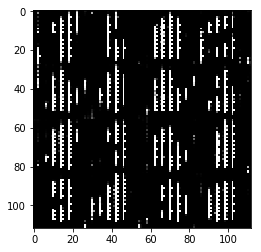

Epoch 1/2... Discriminator Loss: 0.0067... Generator Loss: 6.1427


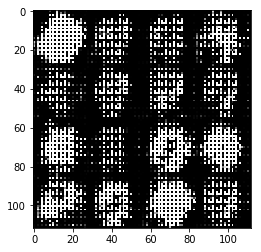

Epoch 1/2... Discriminator Loss: 0.0085... Generator Loss: 6.4739


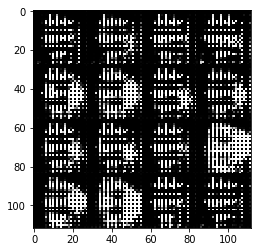

Epoch 1/2... Discriminator Loss: 0.0010... Generator Loss: 7.9412


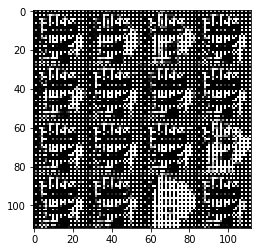

Epoch 1/2... Discriminator Loss: 0.0013... Generator Loss: 9.0576


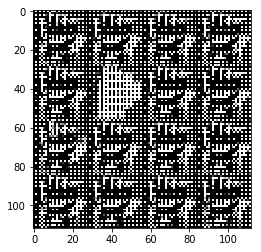

Epoch 1/2... Discriminator Loss: 0.0004... Generator Loss: 9.1765


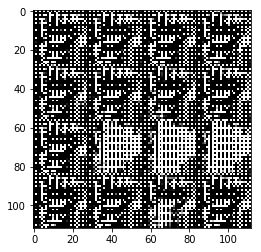

Epoch 1/2... Discriminator Loss: 0.0002... Generator Loss: 9.4517


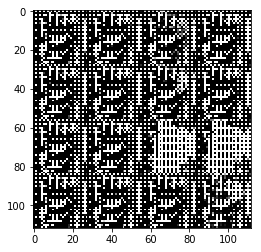

Epoch 1/2... Discriminator Loss: 0.3422... Generator Loss: 3.3200


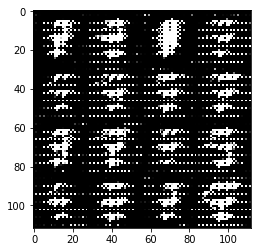

Epoch 1/2... Discriminator Loss: 0.0520... Generator Loss: 3.9936


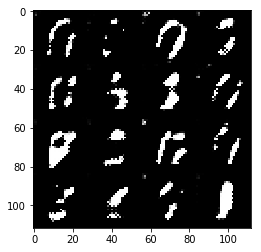

Epoch 1/2... Discriminator Loss: 0.0147... Generator Loss: 5.2303


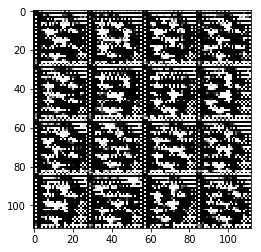

Epoch 1/2... Discriminator Loss: 0.0015... Generator Loss: 7.3103


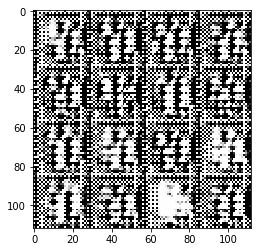

Epoch 1/2... Discriminator Loss: 0.1083... Generator Loss: 4.2986


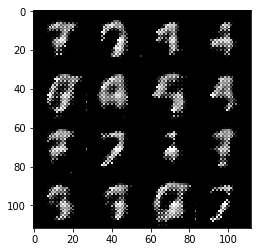

Epoch 1/2... Discriminator Loss: 0.0173... Generator Loss: 4.7377


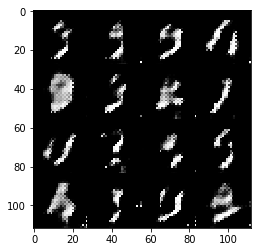

Epoch 1/2... Discriminator Loss: 0.0719... Generator Loss: 4.0270


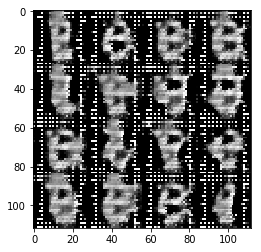

Epoch 2/2... Discriminator Loss: 0.0779... Generator Loss: 4.7042


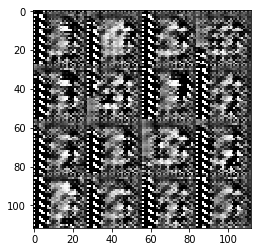

Epoch 2/2... Discriminator Loss: 2.8128... Generator Loss: 0.6030


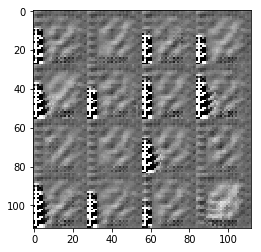

Epoch 2/2... Discriminator Loss: 0.2428... Generator Loss: 3.9075


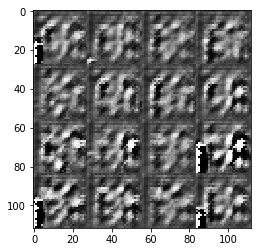

Epoch 2/2... Discriminator Loss: 0.2756... Generator Loss: 3.0429


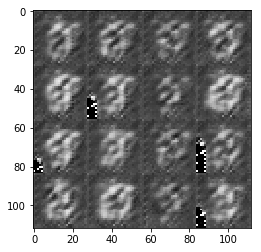

Epoch 2/2... Discriminator Loss: 0.0144... Generator Loss: 6.8924


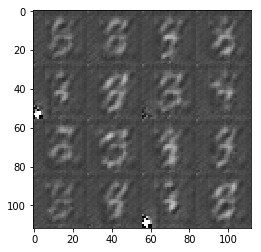

Epoch 2/2... Discriminator Loss: 1.4659... Generator Loss: 3.1595


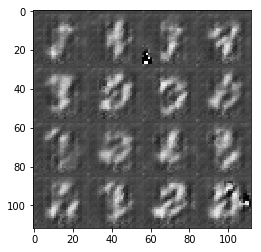

Epoch 2/2... Discriminator Loss: 0.4824... Generator Loss: 2.0877


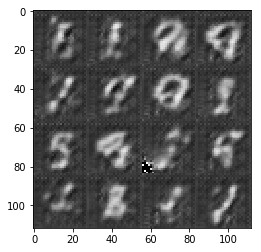

Epoch 2/2... Discriminator Loss: 1.0916... Generator Loss: 3.9750


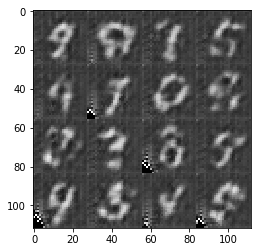

Epoch 2/2... Discriminator Loss: 0.5748... Generator Loss: 1.4140


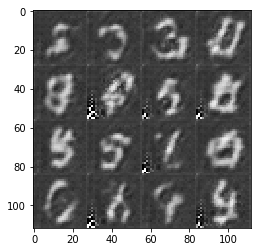

Epoch 2/2... Discriminator Loss: 0.9374... Generator Loss: 1.9335


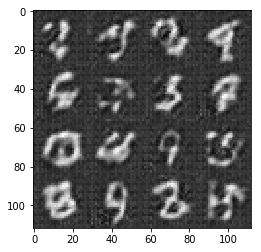

Epoch 2/2... Discriminator Loss: 0.3197... Generator Loss: 2.5745


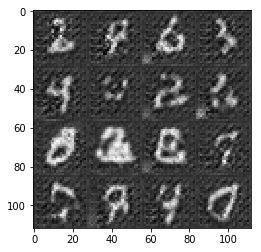

Epoch 2/2... Discriminator Loss: 0.4466... Generator Loss: 1.8629


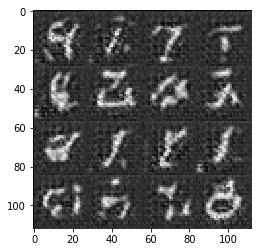

Epoch 2/2... Discriminator Loss: 1.2065... Generator Loss: 0.6040


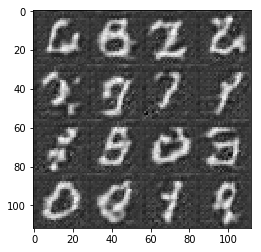

Epoch 2/2... Discriminator Loss: 0.3200... Generator Loss: 3.7987


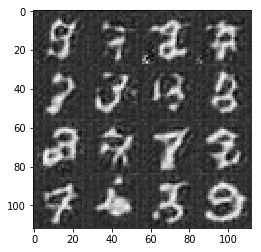

Epoch 2/2... Discriminator Loss: 0.6990... Generator Loss: 1.5883


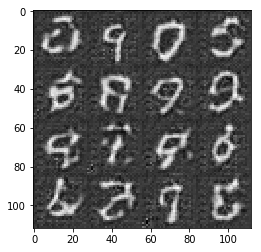

Epoch 2/2... Discriminator Loss: 0.0250... Generator Loss: 5.8310


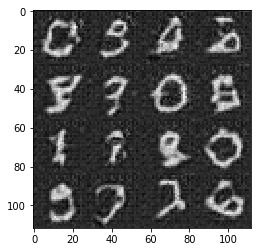

Epoch 2/2... Discriminator Loss: 0.8606... Generator Loss: 0.9221


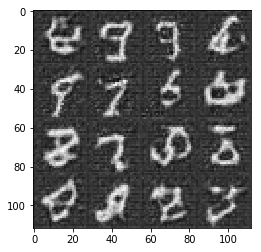

Epoch 2/2... Discriminator Loss: 0.7444... Generator Loss: 1.5607


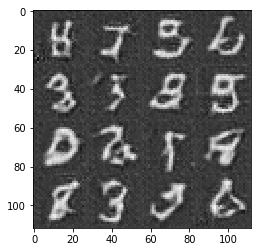

Epoch 2/2... Discriminator Loss: 0.8445... Generator Loss: 1.6266


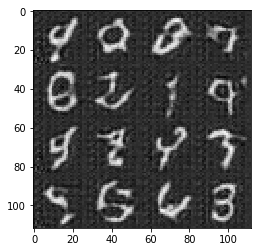

In [12]:
batch_size = 64
z_dim = 128
learning_rate = 0.002
beta1 = 0.5



"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/5... Discriminator Loss: 0.0008... Generator Loss: 21.6646


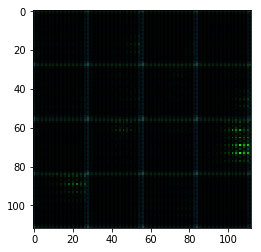

Epoch 1/5... Discriminator Loss: 5.9449... Generator Loss: 0.0044


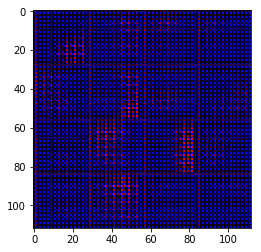

Epoch 1/5... Discriminator Loss: 0.0098... Generator Loss: 4.8274


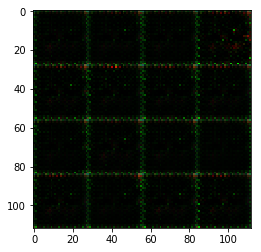

Epoch 1/5... Discriminator Loss: 0.0013... Generator Loss: 6.9349


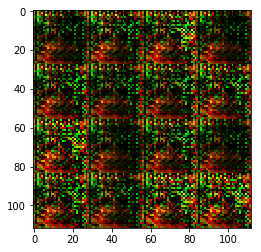

Epoch 1/5... Discriminator Loss: 0.7834... Generator Loss: 1.3515


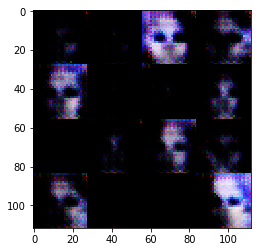

Epoch 1/5... Discriminator Loss: 0.1566... Generator Loss: 2.7791


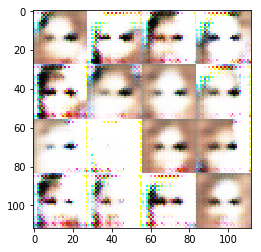

Epoch 1/5... Discriminator Loss: 0.3985... Generator Loss: 3.1420


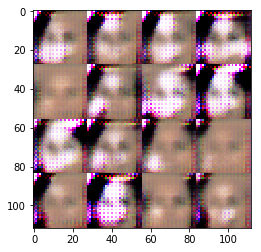

Epoch 1/5... Discriminator Loss: 0.0586... Generator Loss: 4.0681


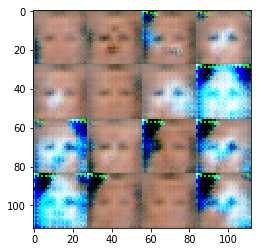

Epoch 1/5... Discriminator Loss: 1.3226... Generator Loss: 0.7880


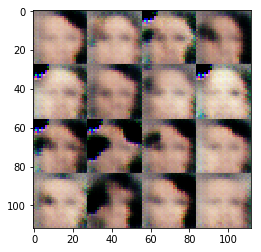

Epoch 1/5... Discriminator Loss: 0.2301... Generator Loss: 2.9535


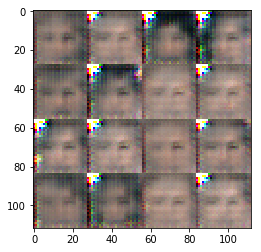

Epoch 1/5... Discriminator Loss: 0.0358... Generator Loss: 3.9388


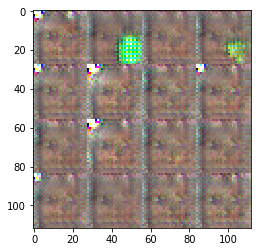

Epoch 1/5... Discriminator Loss: 0.4953... Generator Loss: 1.5288


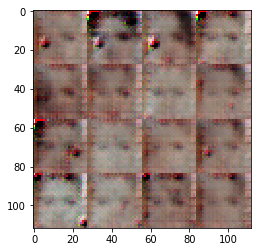

Epoch 1/5... Discriminator Loss: 0.2443... Generator Loss: 3.0874


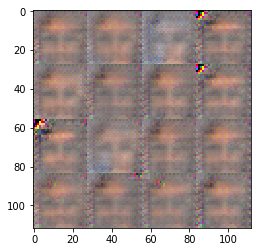

Epoch 1/5... Discriminator Loss: 2.3774... Generator Loss: 0.3995


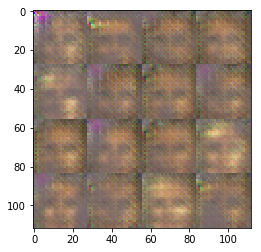

Epoch 1/5... Discriminator Loss: 1.1742... Generator Loss: 0.6032


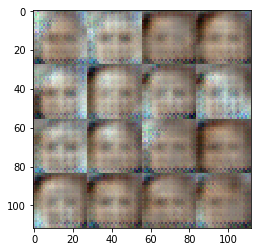

Epoch 1/5... Discriminator Loss: 1.3354... Generator Loss: 0.7469


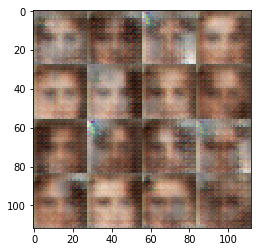

Epoch 1/5... Discriminator Loss: 1.1728... Generator Loss: 0.7903


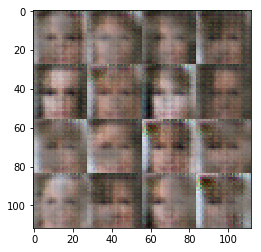

Epoch 1/5... Discriminator Loss: 1.3836... Generator Loss: 0.7793


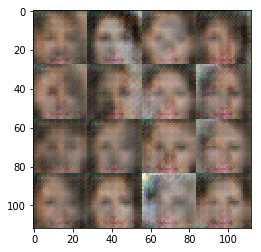

Epoch 1/5... Discriminator Loss: 0.9372... Generator Loss: 1.3812


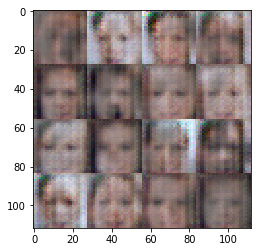

Epoch 1/5... Discriminator Loss: 1.0880... Generator Loss: 0.5777


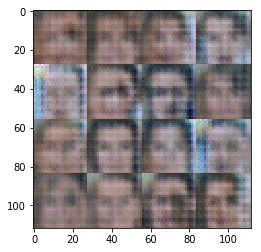

Epoch 1/5... Discriminator Loss: 1.1514... Generator Loss: 0.8753


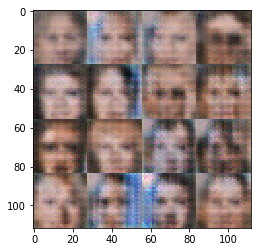

Epoch 1/5... Discriminator Loss: 1.5053... Generator Loss: 1.3560


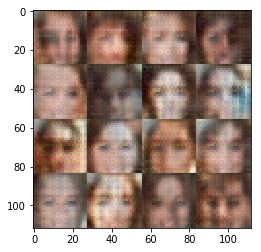

Epoch 1/5... Discriminator Loss: 1.5116... Generator Loss: 0.4856


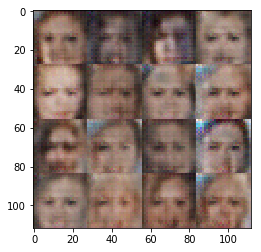

Epoch 1/5... Discriminator Loss: 1.1011... Generator Loss: 0.7053


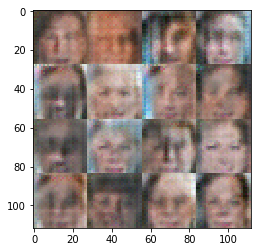

Epoch 1/5... Discriminator Loss: 1.2788... Generator Loss: 0.4483


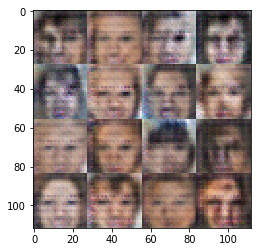

Epoch 1/5... Discriminator Loss: 1.5616... Generator Loss: 1.4326


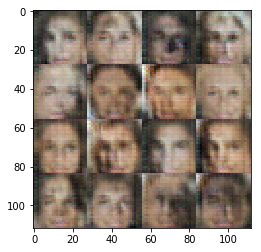

Epoch 1/5... Discriminator Loss: 1.3943... Generator Loss: 0.5390


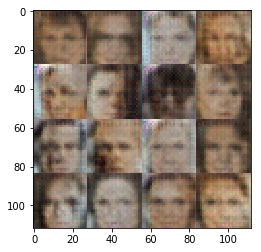

Epoch 1/5... Discriminator Loss: 1.2094... Generator Loss: 0.5706


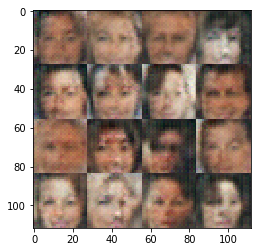

Epoch 1/5... Discriminator Loss: 1.2936... Generator Loss: 0.7513


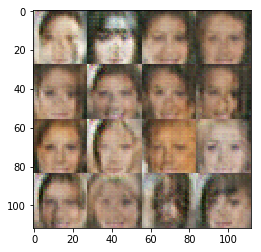

Epoch 1/5... Discriminator Loss: 1.2981... Generator Loss: 1.7564


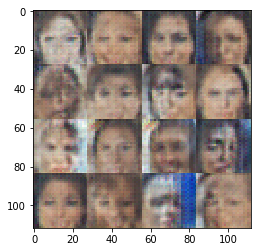

Epoch 1/5... Discriminator Loss: 0.5536... Generator Loss: 1.3264


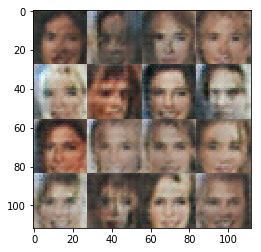

Epoch 1/5... Discriminator Loss: 1.4327... Generator Loss: 0.9472


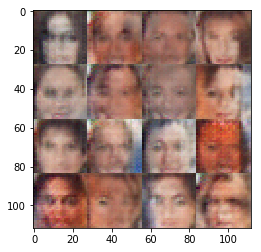

Epoch 1/5... Discriminator Loss: 1.1916... Generator Loss: 0.9736


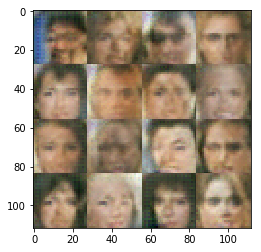

Epoch 1/5... Discriminator Loss: 1.0834... Generator Loss: 0.7956


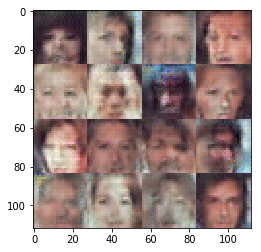

Epoch 1/5... Discriminator Loss: 1.3674... Generator Loss: 0.7142


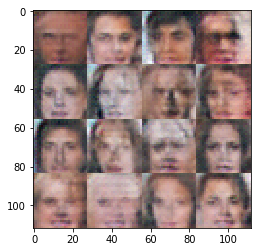

Epoch 1/5... Discriminator Loss: 0.9920... Generator Loss: 1.6168


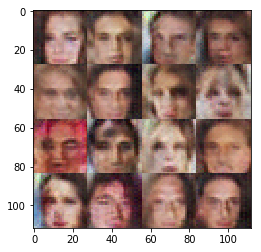

Epoch 1/5... Discriminator Loss: 1.1696... Generator Loss: 0.5987


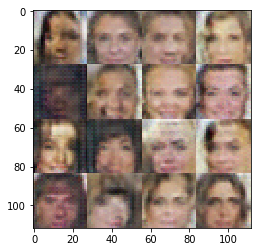

Epoch 1/5... Discriminator Loss: 1.5684... Generator Loss: 0.5018


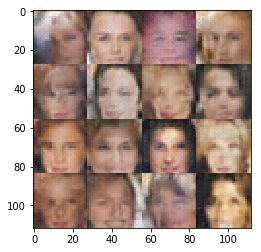

Epoch 1/5... Discriminator Loss: 1.1159... Generator Loss: 0.7062


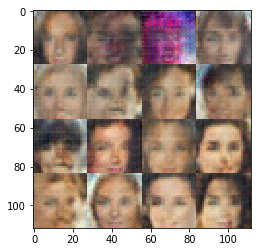

Epoch 1/5... Discriminator Loss: 1.5496... Generator Loss: 0.5075


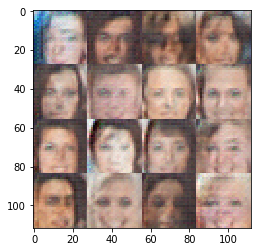

Epoch 1/5... Discriminator Loss: 1.5104... Generator Loss: 1.4346


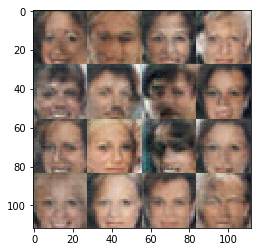

Epoch 1/5... Discriminator Loss: 0.8533... Generator Loss: 1.0608


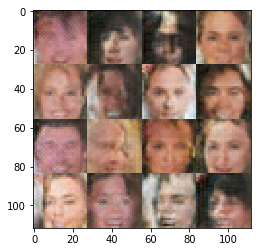

Epoch 1/5... Discriminator Loss: 1.1557... Generator Loss: 0.5608


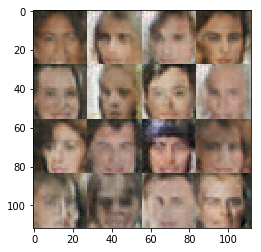

Epoch 1/5... Discriminator Loss: 1.2870... Generator Loss: 0.9369


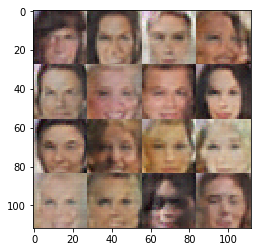

Epoch 1/5... Discriminator Loss: 1.2345... Generator Loss: 0.7820


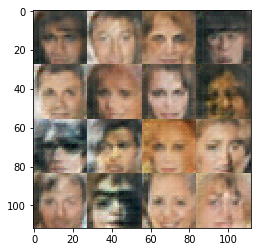

Epoch 1/5... Discriminator Loss: 1.4194... Generator Loss: 0.7770


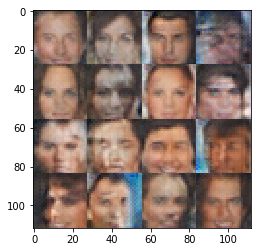

Epoch 1/5... Discriminator Loss: 1.1201... Generator Loss: 1.1457


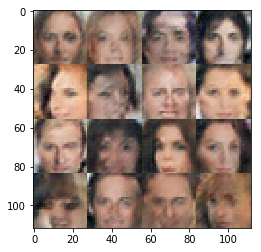

Epoch 1/5... Discriminator Loss: 1.6937... Generator Loss: 0.3475


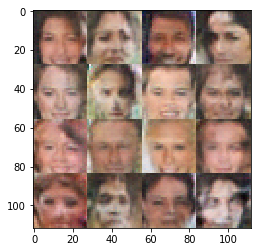

Epoch 1/5... Discriminator Loss: 1.5715... Generator Loss: 0.4066


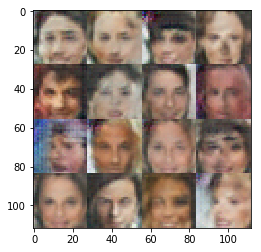

Epoch 1/5... Discriminator Loss: 1.1380... Generator Loss: 0.6898


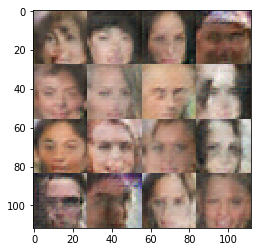

Epoch 1/5... Discriminator Loss: 1.3517... Generator Loss: 0.7093


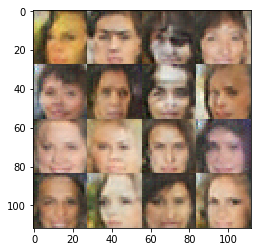

Epoch 1/5... Discriminator Loss: 1.4198... Generator Loss: 0.6184


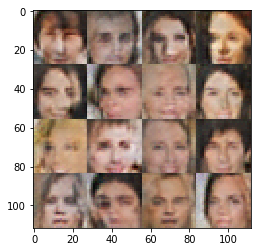

Epoch 1/5... Discriminator Loss: 1.4221... Generator Loss: 0.6509


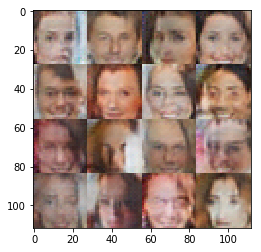

Epoch 1/5... Discriminator Loss: 0.9045... Generator Loss: 1.5371


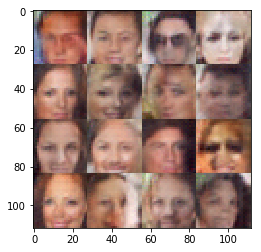

Epoch 1/5... Discriminator Loss: 1.3278... Generator Loss: 0.5820


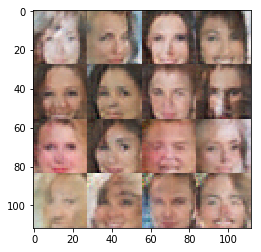

Epoch 1/5... Discriminator Loss: 1.4408... Generator Loss: 0.6344


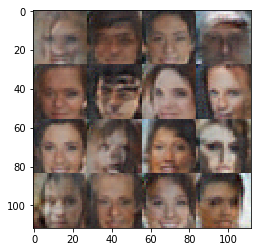

Epoch 1/5... Discriminator Loss: 1.3878... Generator Loss: 0.6110


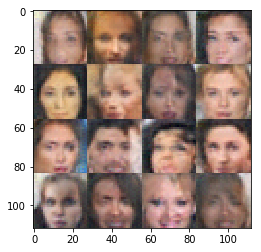

Epoch 1/5... Discriminator Loss: 1.4274... Generator Loss: 0.4943


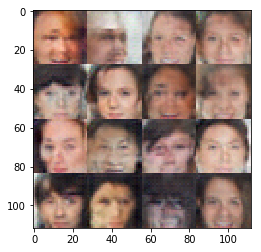

Epoch 1/5... Discriminator Loss: 1.3934... Generator Loss: 0.5272


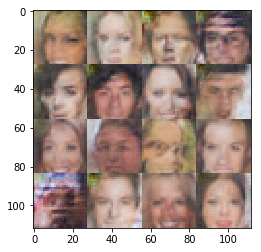

Epoch 1/5... Discriminator Loss: 1.0311... Generator Loss: 0.9652


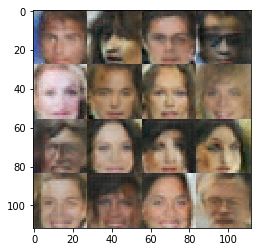

Epoch 1/5... Discriminator Loss: 1.2099... Generator Loss: 0.6658


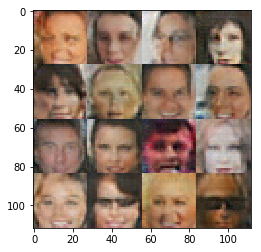

Epoch 1/5... Discriminator Loss: 1.3722... Generator Loss: 0.5373


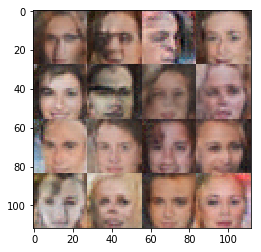

Epoch 1/5... Discriminator Loss: 1.4093... Generator Loss: 0.6420


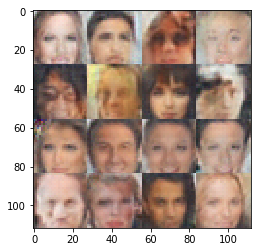

Epoch 2/5... Discriminator Loss: 1.5397... Generator Loss: 0.3880


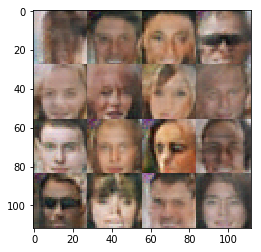

Epoch 2/5... Discriminator Loss: 1.6446... Generator Loss: 0.2721


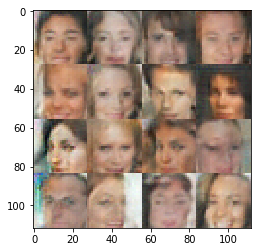

Epoch 2/5... Discriminator Loss: 1.4638... Generator Loss: 0.4455


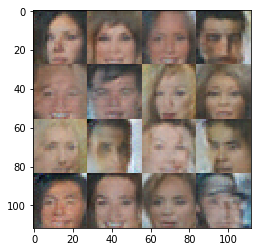

Epoch 2/5... Discriminator Loss: 1.3378... Generator Loss: 0.8146


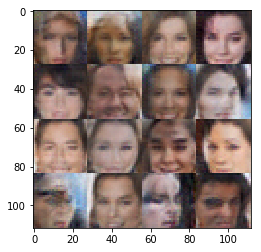

Epoch 2/5... Discriminator Loss: 1.1285... Generator Loss: 0.7730


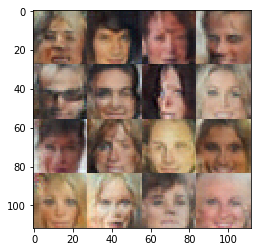

Epoch 2/5... Discriminator Loss: 1.4476... Generator Loss: 0.4434


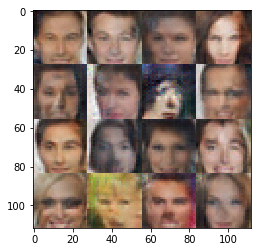

Epoch 2/5... Discriminator Loss: 1.2971... Generator Loss: 0.7409


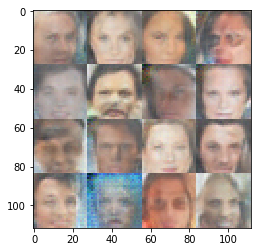

Epoch 2/5... Discriminator Loss: 1.3065... Generator Loss: 0.7714


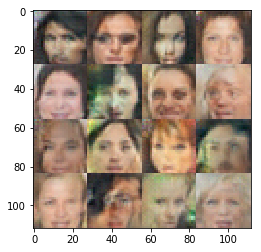

Epoch 2/5... Discriminator Loss: 1.4216... Generator Loss: 0.4831


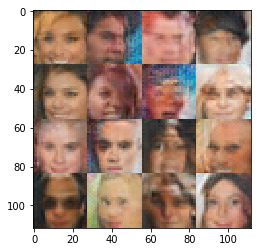

Epoch 2/5... Discriminator Loss: 1.3807... Generator Loss: 0.7004


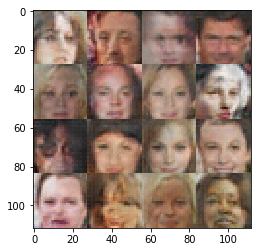

Epoch 2/5... Discriminator Loss: 1.2507... Generator Loss: 0.5629


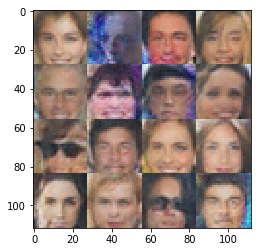

Epoch 2/5... Discriminator Loss: 1.3456... Generator Loss: 0.5537


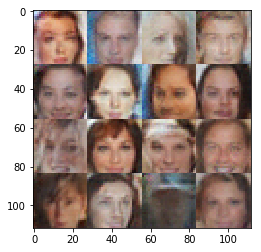

Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.5986


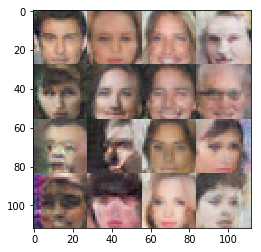

Epoch 2/5... Discriminator Loss: 1.2976... Generator Loss: 0.7243


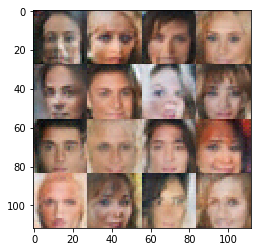

Epoch 2/5... Discriminator Loss: 1.2194... Generator Loss: 0.7728


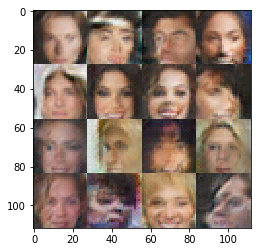

Epoch 2/5... Discriminator Loss: 1.4998... Generator Loss: 0.5268


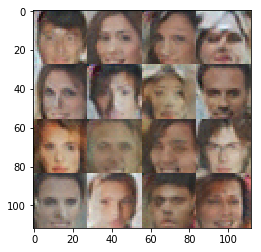

Epoch 2/5... Discriminator Loss: 1.2528... Generator Loss: 0.8066


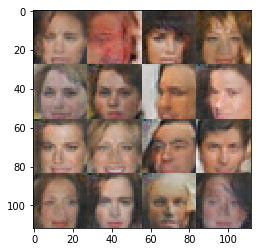

Epoch 2/5... Discriminator Loss: 1.4043... Generator Loss: 0.5690


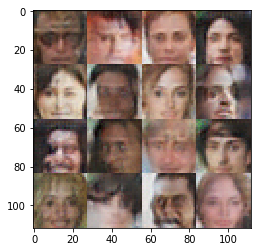

Epoch 2/5... Discriminator Loss: 1.4320... Generator Loss: 0.7473


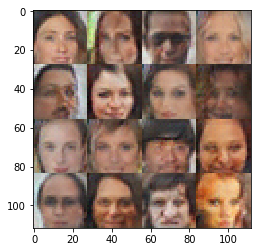

Epoch 2/5... Discriminator Loss: 1.3346... Generator Loss: 0.5394


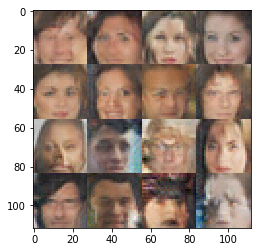

Epoch 2/5... Discriminator Loss: 1.2923... Generator Loss: 0.6523


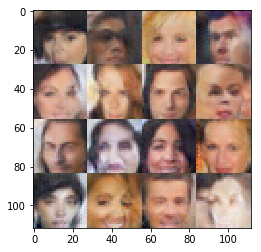

Epoch 2/5... Discriminator Loss: 1.3075... Generator Loss: 0.6258


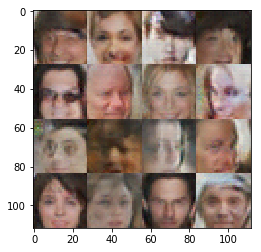

Epoch 2/5... Discriminator Loss: 1.4483... Generator Loss: 0.4772


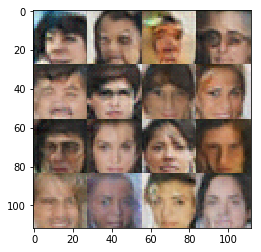

Epoch 2/5... Discriminator Loss: 1.4122... Generator Loss: 0.6874


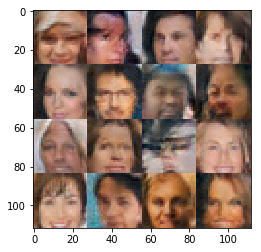

Epoch 2/5... Discriminator Loss: 1.4305... Generator Loss: 0.5569


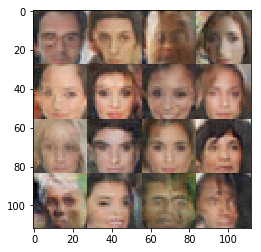

Epoch 2/5... Discriminator Loss: 1.3102... Generator Loss: 0.5589


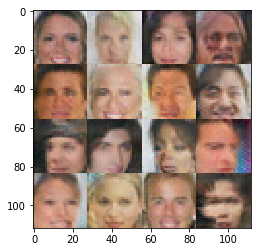

Epoch 2/5... Discriminator Loss: 1.3831... Generator Loss: 0.6372


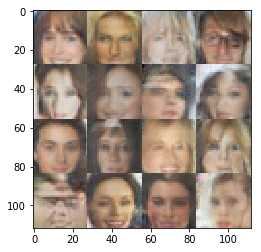

Epoch 2/5... Discriminator Loss: 1.4377... Generator Loss: 0.5096


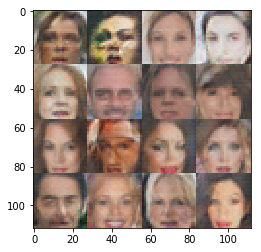

Epoch 2/5... Discriminator Loss: 1.4675... Generator Loss: 0.5432


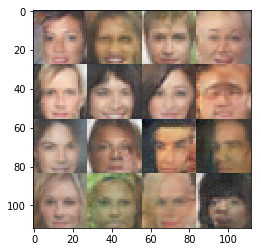

Epoch 2/5... Discriminator Loss: 1.3673... Generator Loss: 0.6833


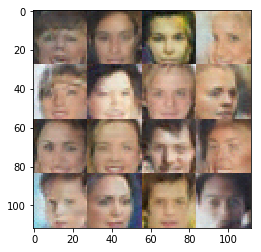

Epoch 2/5... Discriminator Loss: 1.4301... Generator Loss: 0.6057


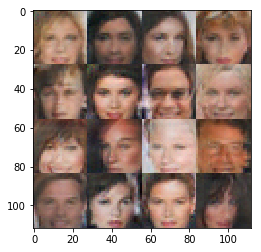

Epoch 2/5... Discriminator Loss: 1.5753... Generator Loss: 0.4830


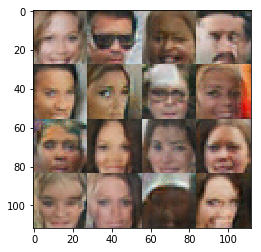

Epoch 2/5... Discriminator Loss: 1.4788... Generator Loss: 0.4167


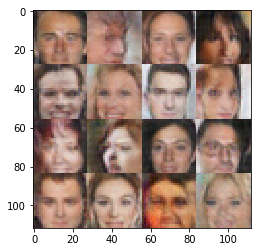

Epoch 2/5... Discriminator Loss: 1.4197... Generator Loss: 0.5744


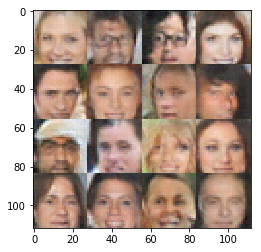

Epoch 2/5... Discriminator Loss: 1.2221... Generator Loss: 0.8315


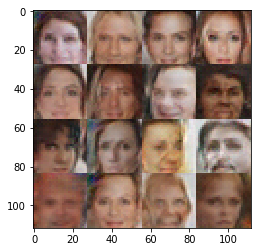

Epoch 2/5... Discriminator Loss: 1.4584... Generator Loss: 0.4672


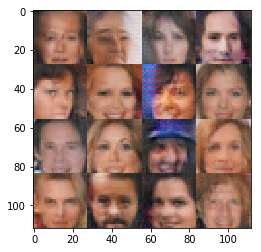

Epoch 2/5... Discriminator Loss: 1.3142... Generator Loss: 0.6009


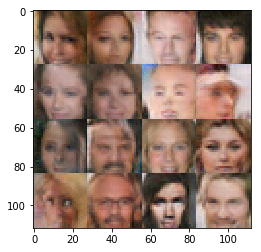

Epoch 2/5... Discriminator Loss: 1.3904... Generator Loss: 0.6420


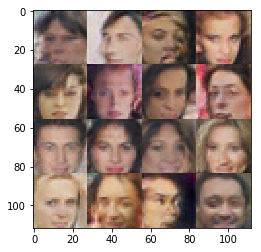

Epoch 2/5... Discriminator Loss: 1.3270... Generator Loss: 0.5954


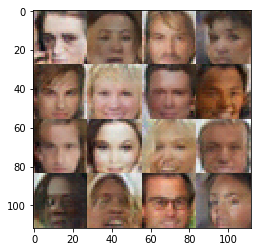

Epoch 2/5... Discriminator Loss: 1.4207... Generator Loss: 0.5049


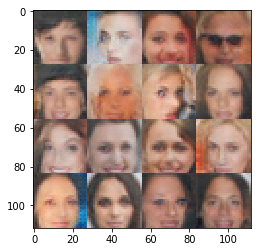

Epoch 2/5... Discriminator Loss: 1.3374... Generator Loss: 0.5935


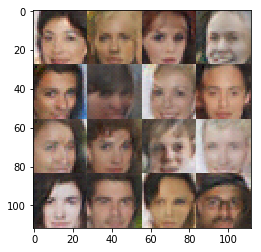

Epoch 2/5... Discriminator Loss: 1.4300... Generator Loss: 0.5325


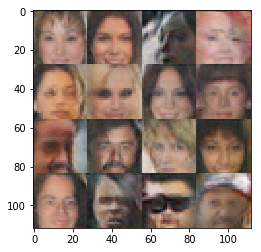

Epoch 2/5... Discriminator Loss: 1.3448... Generator Loss: 0.5463


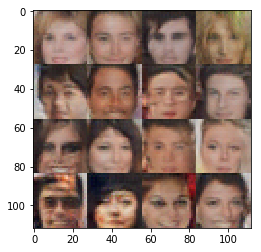

Epoch 2/5... Discriminator Loss: 1.3618... Generator Loss: 0.5593


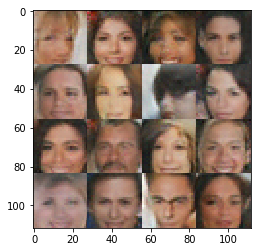

Epoch 2/5... Discriminator Loss: 1.3965... Generator Loss: 0.6259


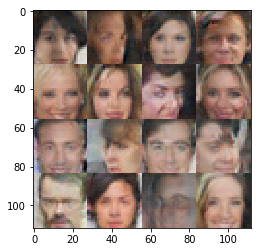

Epoch 2/5... Discriminator Loss: 1.3804... Generator Loss: 0.5979


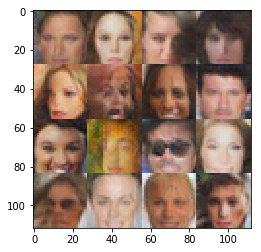

Epoch 2/5... Discriminator Loss: 1.4871... Generator Loss: 0.5557


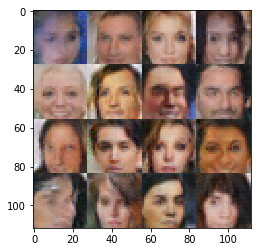

Epoch 2/5... Discriminator Loss: 1.5933... Generator Loss: 0.4274


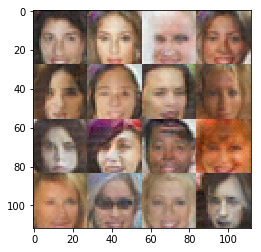

Epoch 2/5... Discriminator Loss: 1.3398... Generator Loss: 0.6057


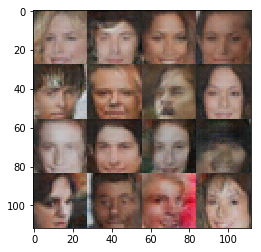

Epoch 2/5... Discriminator Loss: 1.3801... Generator Loss: 0.6730


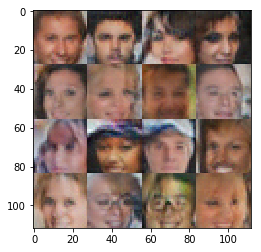

Epoch 2/5... Discriminator Loss: 1.3662... Generator Loss: 0.6752


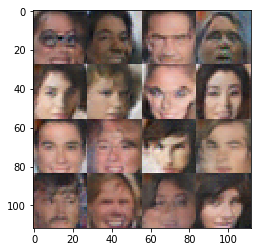

Epoch 2/5... Discriminator Loss: 1.4542... Generator Loss: 0.5399


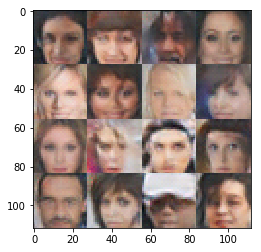

Epoch 2/5... Discriminator Loss: 1.4770... Generator Loss: 0.6216


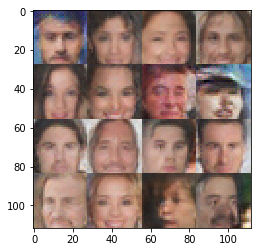

Epoch 2/5... Discriminator Loss: 1.3932... Generator Loss: 0.7052


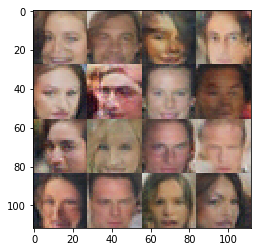

Epoch 2/5... Discriminator Loss: 1.4743... Generator Loss: 0.4349


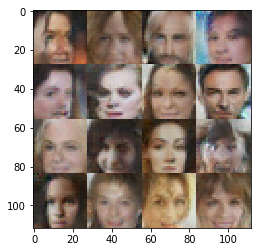

Epoch 2/5... Discriminator Loss: 1.5785... Generator Loss: 0.4492


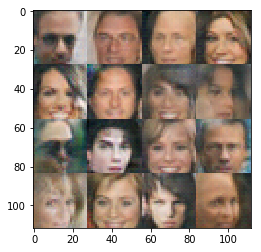

Epoch 2/5... Discriminator Loss: 1.3283... Generator Loss: 0.8184


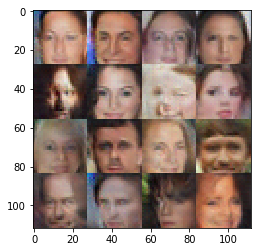

Epoch 2/5... Discriminator Loss: 1.4222... Generator Loss: 0.5001


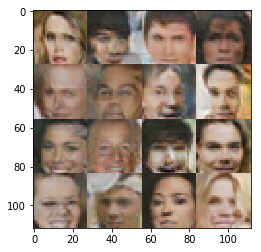

Epoch 2/5... Discriminator Loss: 1.4138... Generator Loss: 0.5208


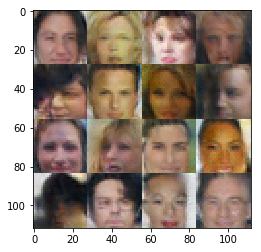

Epoch 2/5... Discriminator Loss: 1.4309... Generator Loss: 0.4586


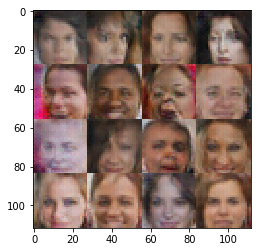

Epoch 2/5... Discriminator Loss: 1.4207... Generator Loss: 0.4750


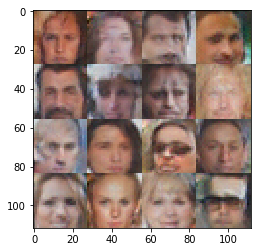

Epoch 2/5... Discriminator Loss: 1.4959... Generator Loss: 0.4249


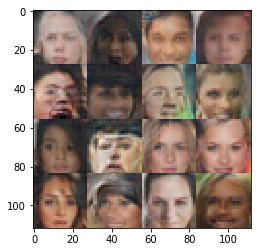

Epoch 2/5... Discriminator Loss: 1.3127... Generator Loss: 0.5647


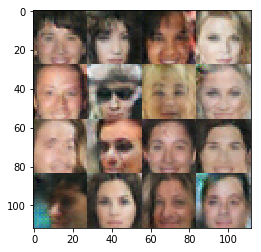

Epoch 3/5... Discriminator Loss: 1.4458... Generator Loss: 0.5438


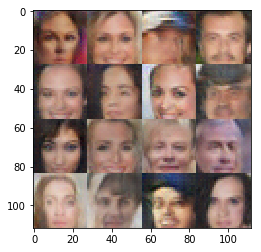

Epoch 3/5... Discriminator Loss: 1.6169... Generator Loss: 0.4449


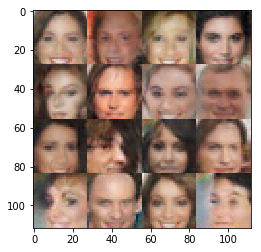

Epoch 3/5... Discriminator Loss: 1.3907... Generator Loss: 0.5931


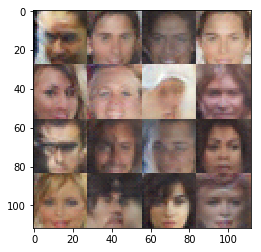

Epoch 3/5... Discriminator Loss: 1.4305... Generator Loss: 0.5324


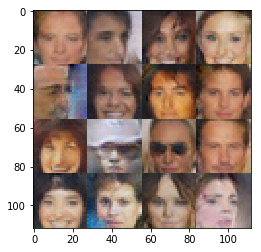

Epoch 3/5... Discriminator Loss: 1.3337... Generator Loss: 0.5877


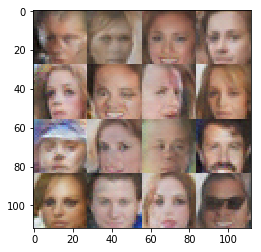

Epoch 3/5... Discriminator Loss: 1.3470... Generator Loss: 0.6267


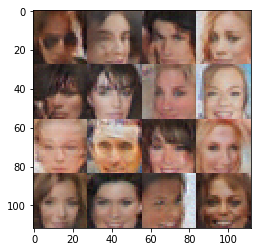

Epoch 3/5... Discriminator Loss: 1.5082... Generator Loss: 0.4839


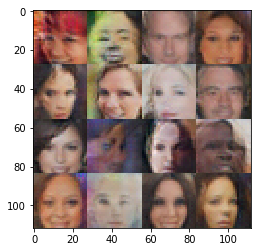

Epoch 3/5... Discriminator Loss: 1.4361... Generator Loss: 0.5475


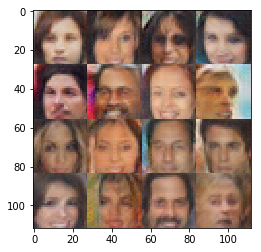

Epoch 3/5... Discriminator Loss: 1.3534... Generator Loss: 0.7075


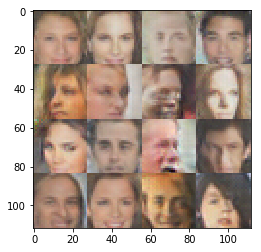

Epoch 3/5... Discriminator Loss: 1.5004... Generator Loss: 0.5762


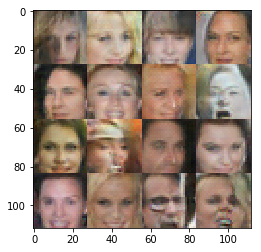

Epoch 3/5... Discriminator Loss: 1.3808... Generator Loss: 0.5699


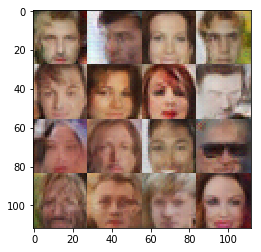

Epoch 3/5... Discriminator Loss: 1.4373... Generator Loss: 0.4562


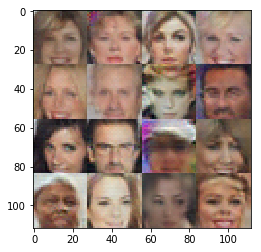

Epoch 3/5... Discriminator Loss: 1.3696... Generator Loss: 0.5868


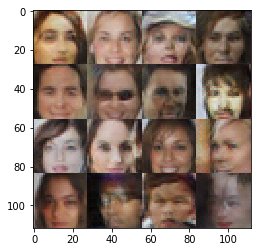

Epoch 3/5... Discriminator Loss: 1.4541... Generator Loss: 0.4618


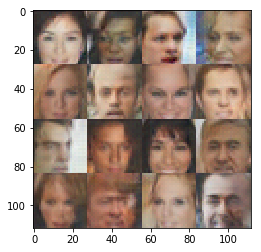

Epoch 3/5... Discriminator Loss: 1.3407... Generator Loss: 0.5954


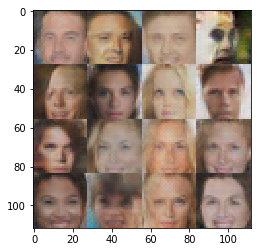

Epoch 3/5... Discriminator Loss: 1.4482... Generator Loss: 0.5162


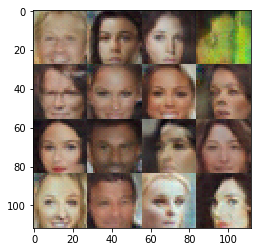

Epoch 3/5... Discriminator Loss: 1.5721... Generator Loss: 0.4257


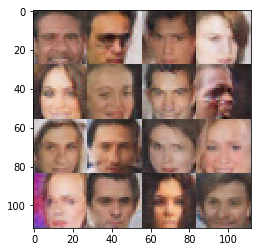

Epoch 3/5... Discriminator Loss: 1.4824... Generator Loss: 0.4451


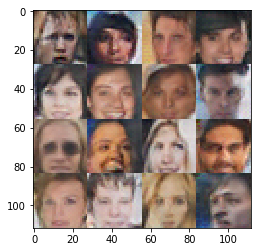

Epoch 3/5... Discriminator Loss: 1.8518... Generator Loss: 0.2891


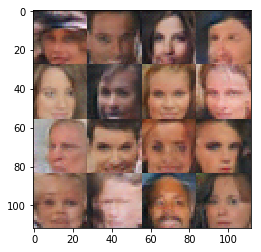

Epoch 3/5... Discriminator Loss: 1.4237... Generator Loss: 0.5927


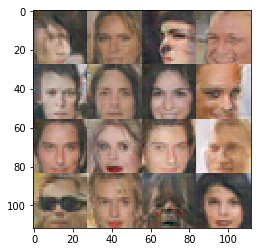

Epoch 3/5... Discriminator Loss: 1.7841... Generator Loss: 0.3635


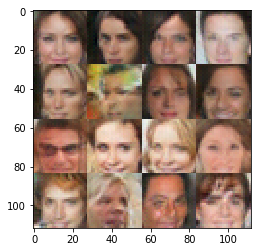

Epoch 3/5... Discriminator Loss: 1.4276... Generator Loss: 0.5657


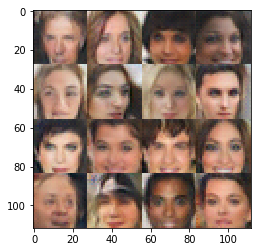

Epoch 3/5... Discriminator Loss: 1.6354... Generator Loss: 0.4489


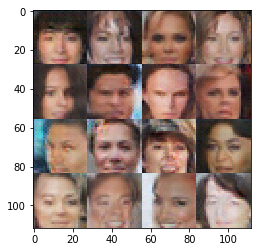

Epoch 3/5... Discriminator Loss: 1.7319... Generator Loss: 0.3979


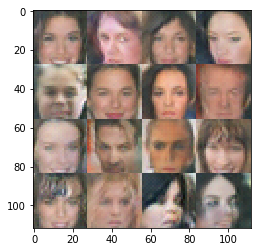

Epoch 3/5... Discriminator Loss: 1.4977... Generator Loss: 0.5242


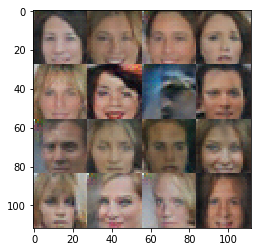

Epoch 3/5... Discriminator Loss: 1.4515... Generator Loss: 0.4980


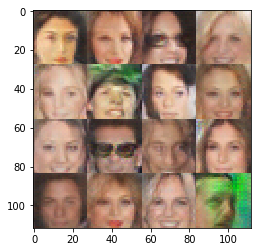

Epoch 3/5... Discriminator Loss: 1.3523... Generator Loss: 0.5611


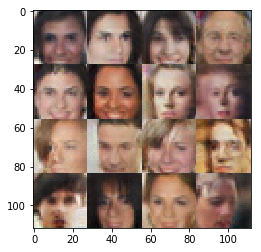

Epoch 3/5... Discriminator Loss: 1.5637... Generator Loss: 0.3808


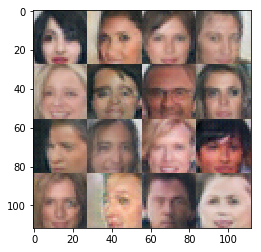

Epoch 3/5... Discriminator Loss: 1.6897... Generator Loss: 0.3940


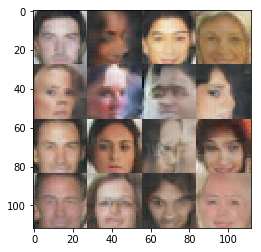

Epoch 3/5... Discriminator Loss: 1.5518... Generator Loss: 0.4650


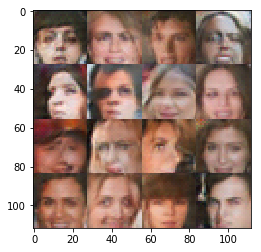

Epoch 3/5... Discriminator Loss: 1.4841... Generator Loss: 0.6609


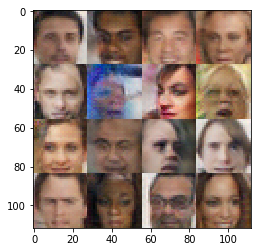

Epoch 3/5... Discriminator Loss: 1.6041... Generator Loss: 0.4564


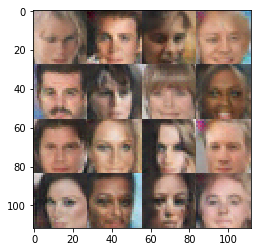

Epoch 3/5... Discriminator Loss: 1.4673... Generator Loss: 0.5378


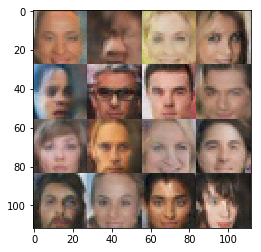

Epoch 3/5... Discriminator Loss: 1.5118... Generator Loss: 0.5038


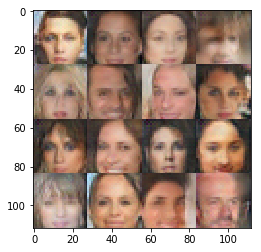

Epoch 3/5... Discriminator Loss: 1.7925... Generator Loss: 0.3796


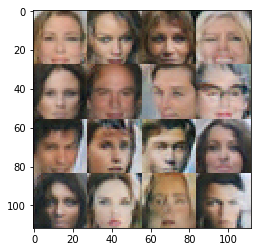

Epoch 3/5... Discriminator Loss: 1.5248... Generator Loss: 0.4365


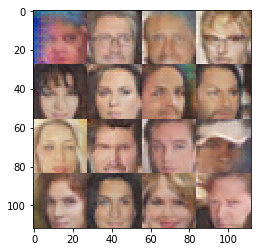

Epoch 3/5... Discriminator Loss: 1.3450... Generator Loss: 0.5243


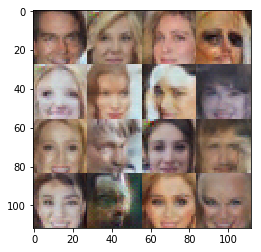

Epoch 3/5... Discriminator Loss: 1.3374... Generator Loss: 0.6983


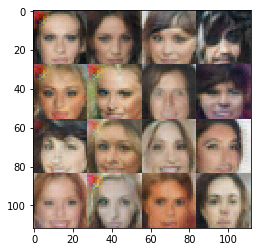

Epoch 3/5... Discriminator Loss: 1.3947... Generator Loss: 0.5442


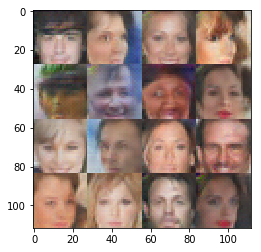

Epoch 3/5... Discriminator Loss: 1.3794... Generator Loss: 0.5662


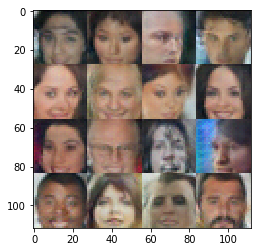

Epoch 3/5... Discriminator Loss: 1.6348... Generator Loss: 0.4029


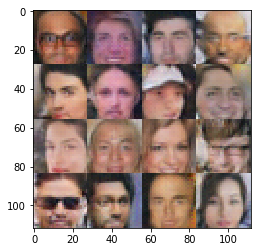

Epoch 3/5... Discriminator Loss: 1.3023... Generator Loss: 0.4990


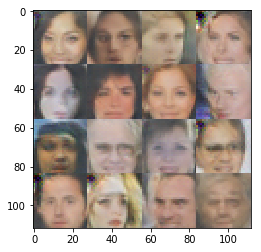

Epoch 3/5... Discriminator Loss: 0.0966... Generator Loss: 3.7446


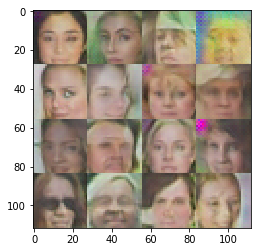

Epoch 3/5... Discriminator Loss: 1.3385... Generator Loss: 0.5311


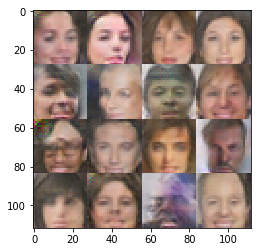

Epoch 3/5... Discriminator Loss: 1.0552... Generator Loss: 0.7980


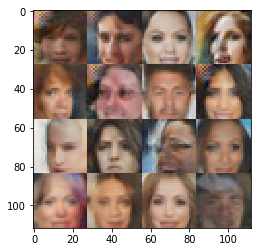

Epoch 3/5... Discriminator Loss: 1.3159... Generator Loss: 1.0966


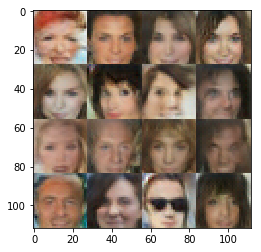

Epoch 3/5... Discriminator Loss: 1.3869... Generator Loss: 0.5494


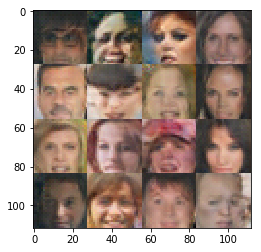

Epoch 3/5... Discriminator Loss: 1.4842... Generator Loss: 0.4411


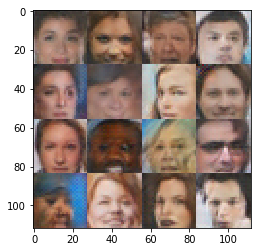

Epoch 3/5... Discriminator Loss: 1.6284... Generator Loss: 0.4032


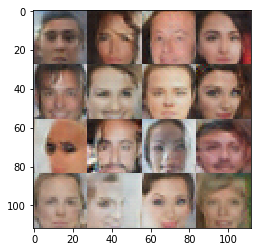

Epoch 3/5... Discriminator Loss: 1.5039... Generator Loss: 0.4275


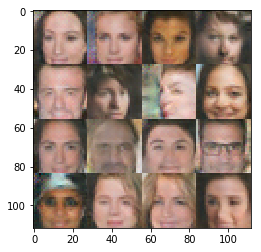

Epoch 3/5... Discriminator Loss: 1.4002... Generator Loss: 0.4800


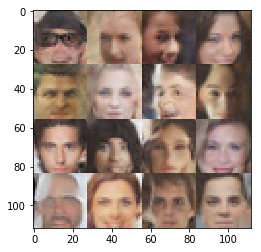

Epoch 3/5... Discriminator Loss: 1.2702... Generator Loss: 0.5844


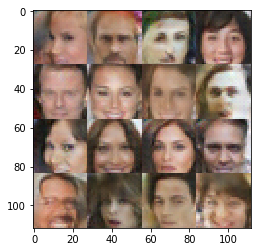

Epoch 3/5... Discriminator Loss: 1.5616... Generator Loss: 0.4603


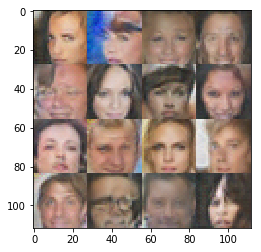

Epoch 3/5... Discriminator Loss: 1.4109... Generator Loss: 0.4893


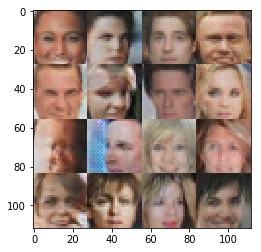

Epoch 3/5... Discriminator Loss: 1.2856... Generator Loss: 0.5843


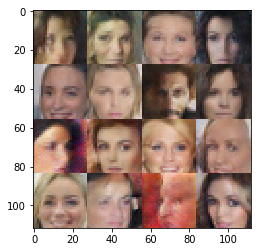

Epoch 3/5... Discriminator Loss: 1.7637... Generator Loss: 0.3543


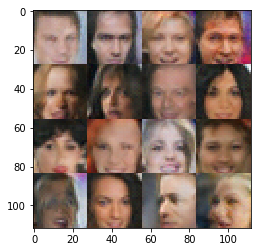

Epoch 3/5... Discriminator Loss: 1.8101... Generator Loss: 0.2913


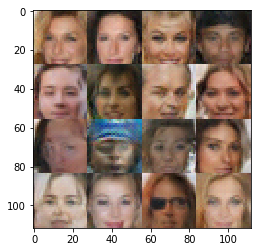

Epoch 3/5... Discriminator Loss: 1.6315... Generator Loss: 0.4435


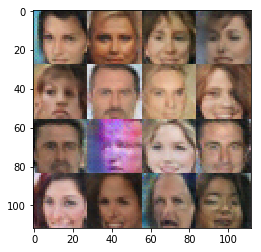

Epoch 3/5... Discriminator Loss: 1.6138... Generator Loss: 0.3884


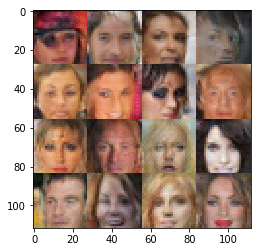

Epoch 3/5... Discriminator Loss: 1.3447... Generator Loss: 0.5434


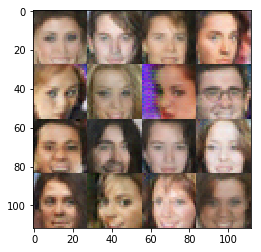

Epoch 3/5... Discriminator Loss: 1.5497... Generator Loss: 0.5093


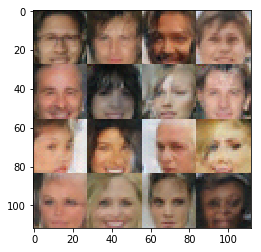

Epoch 3/5... Discriminator Loss: 1.5329... Generator Loss: 0.4387


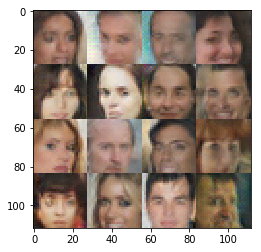

Epoch 3/5... Discriminator Loss: 1.4762... Generator Loss: 0.4878


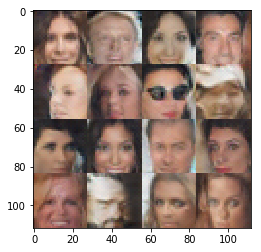

Epoch 4/5... Discriminator Loss: 1.5057... Generator Loss: 0.5241


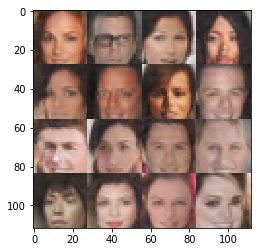

Epoch 4/5... Discriminator Loss: 1.4285... Generator Loss: 0.5211


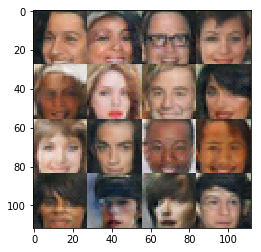

Epoch 4/5... Discriminator Loss: 1.6295... Generator Loss: 0.5164


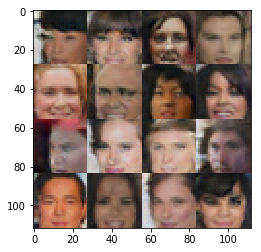

Epoch 4/5... Discriminator Loss: 1.4756... Generator Loss: 0.5188


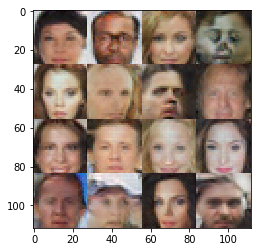

Epoch 4/5... Discriminator Loss: 1.5739... Generator Loss: 0.4361


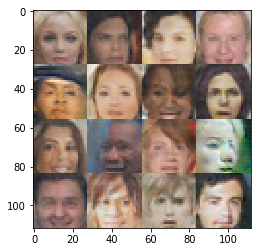

Epoch 4/5... Discriminator Loss: 1.4942... Generator Loss: 0.5811


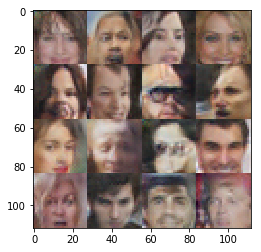

Epoch 4/5... Discriminator Loss: 1.5133... Generator Loss: 0.4587


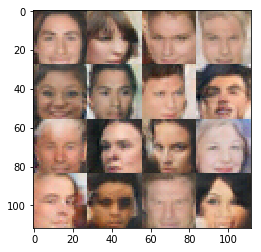

Epoch 4/5... Discriminator Loss: 1.6616... Generator Loss: 0.4365


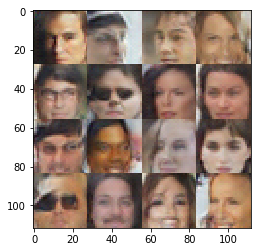

Epoch 4/5... Discriminator Loss: 1.8356... Generator Loss: 0.3076


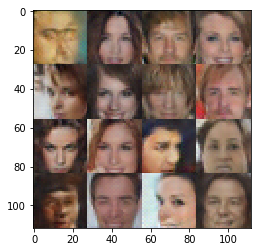

Epoch 4/5... Discriminator Loss: 1.4882... Generator Loss: 0.5293


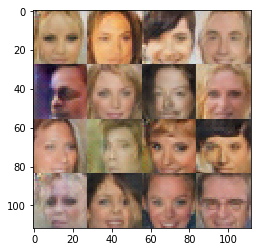

Epoch 4/5... Discriminator Loss: 1.5119... Generator Loss: 0.4894


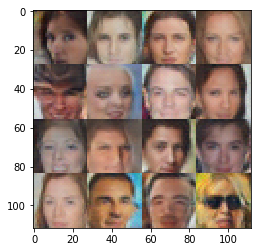

Epoch 4/5... Discriminator Loss: 1.3899... Generator Loss: 0.4902


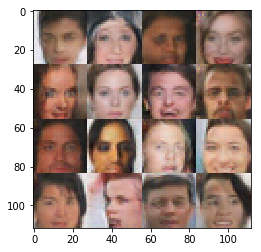

Epoch 4/5... Discriminator Loss: 1.6280... Generator Loss: 0.4317


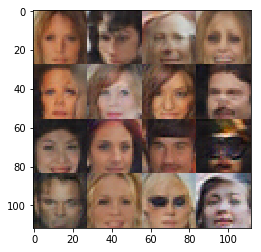

Epoch 4/5... Discriminator Loss: 1.4952... Generator Loss: 0.4417


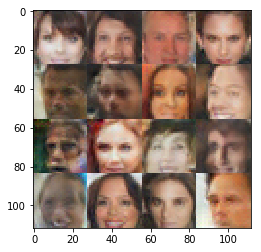

Epoch 4/5... Discriminator Loss: 1.3047... Generator Loss: 0.5630


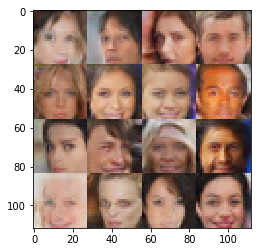

Epoch 4/5... Discriminator Loss: 1.3882... Generator Loss: 0.5019


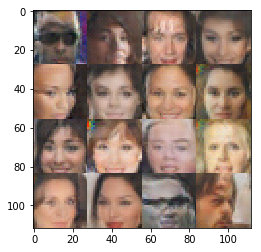

Epoch 4/5... Discriminator Loss: 1.4753... Generator Loss: 0.4595


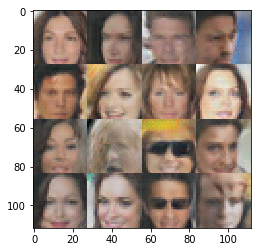

Epoch 4/5... Discriminator Loss: 1.5937... Generator Loss: 0.4242


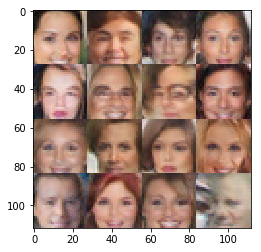

Epoch 4/5... Discriminator Loss: 1.4414... Generator Loss: 0.5371


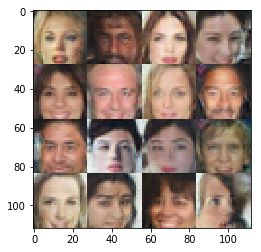

Epoch 4/5... Discriminator Loss: 1.6846... Generator Loss: 0.3862


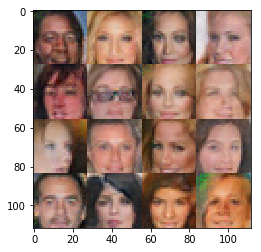

Epoch 4/5... Discriminator Loss: 1.6055... Generator Loss: 0.4375


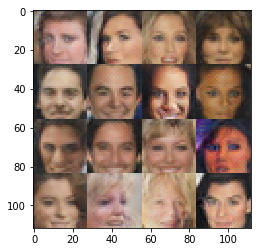

Epoch 4/5... Discriminator Loss: 1.5051... Generator Loss: 0.4887


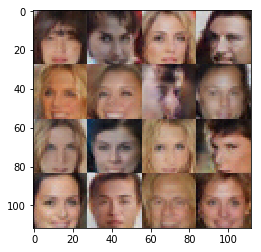

Epoch 4/5... Discriminator Loss: 1.5998... Generator Loss: 0.4095


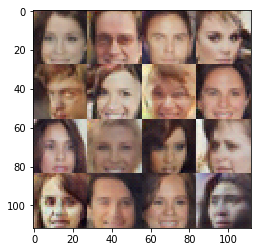

Epoch 4/5... Discriminator Loss: 1.4583... Generator Loss: 0.4529


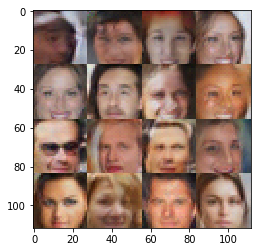

Epoch 4/5... Discriminator Loss: 1.7773... Generator Loss: 0.2849


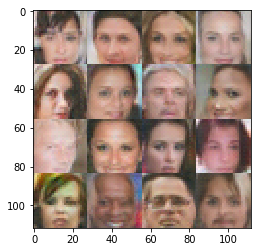

Epoch 4/5... Discriminator Loss: 1.6213... Generator Loss: 0.4097


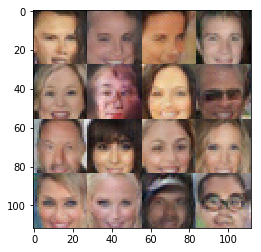

Epoch 4/5... Discriminator Loss: 1.8735... Generator Loss: 0.3527


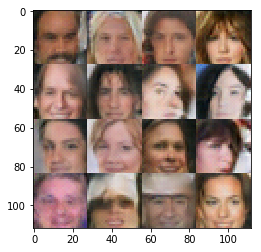

Epoch 4/5... Discriminator Loss: 1.5485... Generator Loss: 0.5038


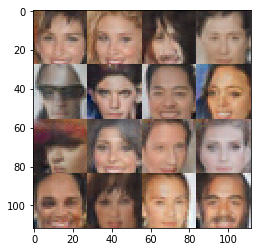

Epoch 4/5... Discriminator Loss: 1.4977... Generator Loss: 0.4953


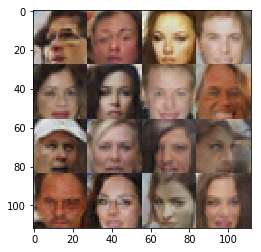

Epoch 4/5... Discriminator Loss: 1.5696... Generator Loss: 0.4085


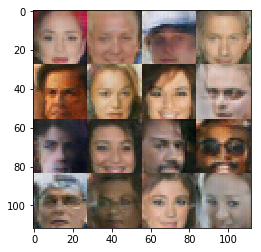

Epoch 4/5... Discriminator Loss: 1.4485... Generator Loss: 0.4714


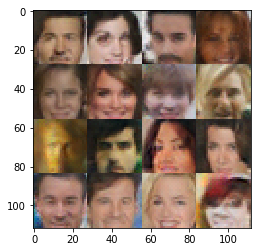

Epoch 4/5... Discriminator Loss: 1.3437... Generator Loss: 0.5217


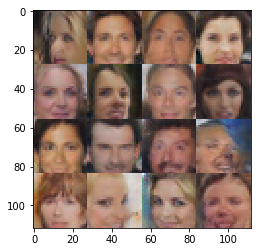

Epoch 4/5... Discriminator Loss: 1.5035... Generator Loss: 0.4387


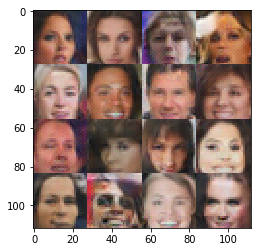

Epoch 4/5... Discriminator Loss: 1.4074... Generator Loss: 0.5781


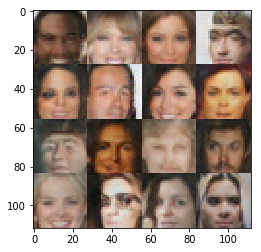

Epoch 4/5... Discriminator Loss: 1.4754... Generator Loss: 0.4716


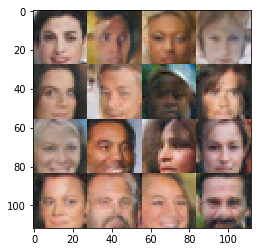

Epoch 4/5... Discriminator Loss: 1.7071... Generator Loss: 0.3608


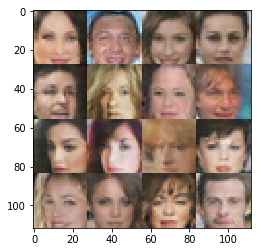

Epoch 4/5... Discriminator Loss: 1.5976... Generator Loss: 0.4313


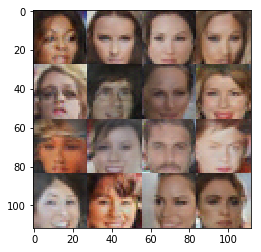

Epoch 4/5... Discriminator Loss: 1.5290... Generator Loss: 0.4293


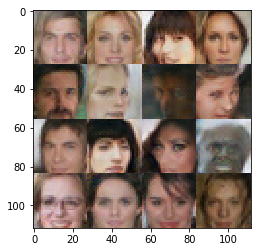

Epoch 4/5... Discriminator Loss: 1.4780... Generator Loss: 0.4551


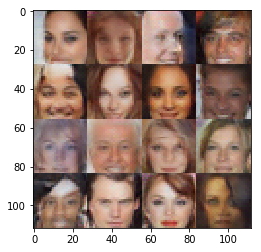

Epoch 4/5... Discriminator Loss: 1.5213... Generator Loss: 0.4303


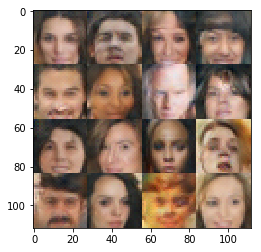

Epoch 4/5... Discriminator Loss: 1.7562... Generator Loss: 0.3975


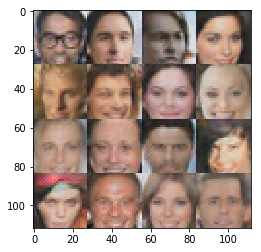

Epoch 4/5... Discriminator Loss: 1.6631... Generator Loss: 0.4400


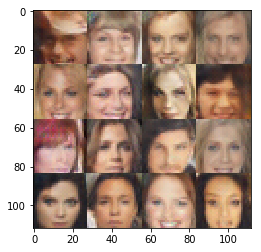

Epoch 4/5... Discriminator Loss: 1.6016... Generator Loss: 0.4746


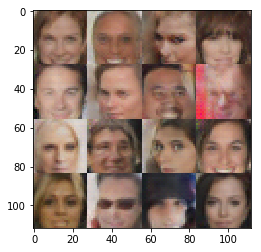

Epoch 4/5... Discriminator Loss: 1.5087... Generator Loss: 0.4305


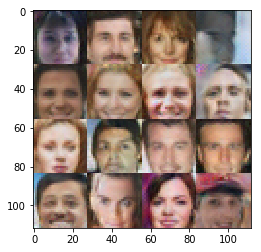

Epoch 4/5... Discriminator Loss: 1.2401... Generator Loss: 0.5921


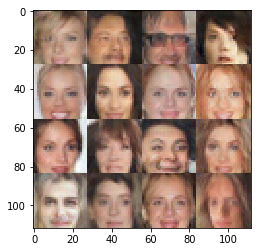

Epoch 4/5... Discriminator Loss: 1.5507... Generator Loss: 0.4651


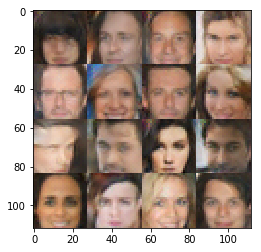

Epoch 4/5... Discriminator Loss: 0.9762... Generator Loss: 0.8295


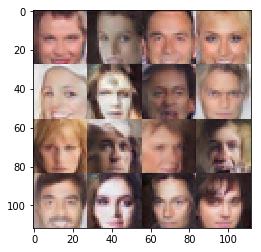

Epoch 4/5... Discriminator Loss: 1.6464... Generator Loss: 0.3574


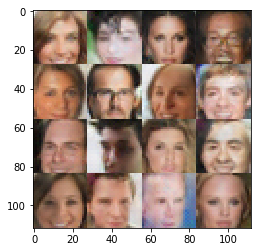

Epoch 4/5... Discriminator Loss: 1.6706... Generator Loss: 0.3720


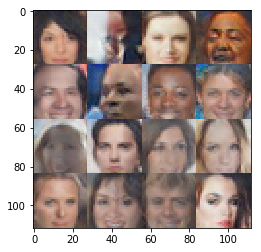

Epoch 4/5... Discriminator Loss: 1.4346... Generator Loss: 0.4904


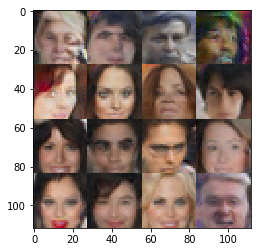

Epoch 4/5... Discriminator Loss: 1.4709... Generator Loss: 0.4484


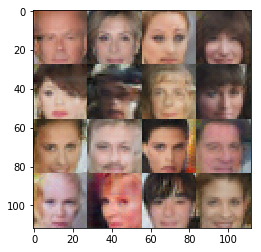

Epoch 4/5... Discriminator Loss: 1.6977... Generator Loss: 0.3675


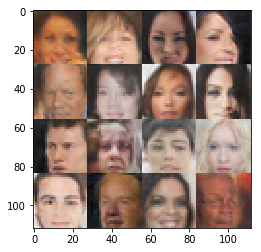

Epoch 4/5... Discriminator Loss: 1.8885... Generator Loss: 0.3183


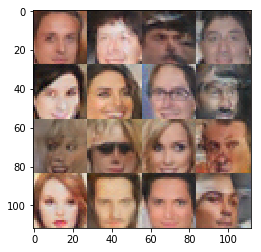

Epoch 4/5... Discriminator Loss: 1.7995... Generator Loss: 0.3058


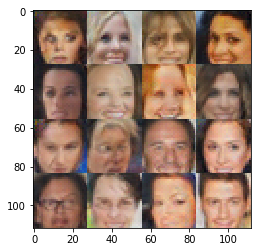

Epoch 4/5... Discriminator Loss: 1.3116... Generator Loss: 0.5602


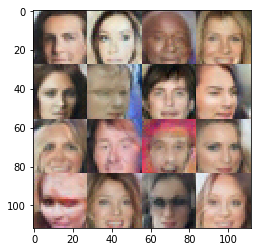

Epoch 4/5... Discriminator Loss: 1.5918... Generator Loss: 0.3703


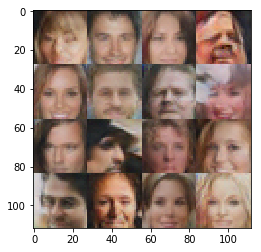

Epoch 4/5... Discriminator Loss: 1.5676... Generator Loss: 0.5698


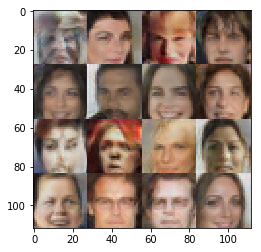

Epoch 4/5... Discriminator Loss: 1.5656... Generator Loss: 0.4078


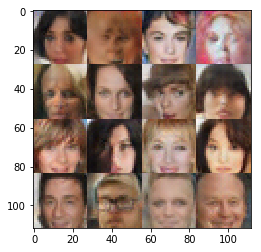

Epoch 4/5... Discriminator Loss: 1.8050... Generator Loss: 0.3173


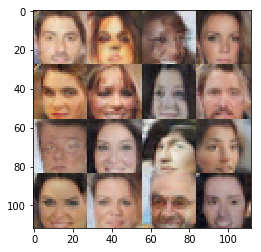

Epoch 4/5... Discriminator Loss: 1.4335... Generator Loss: 0.5547


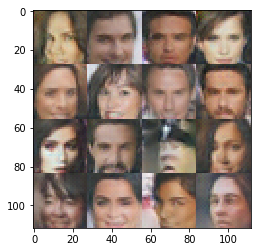

Epoch 4/5... Discriminator Loss: 1.5856... Generator Loss: 0.4159


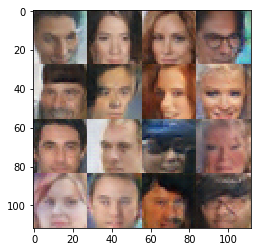

Epoch 4/5... Discriminator Loss: 1.5600... Generator Loss: 0.4087


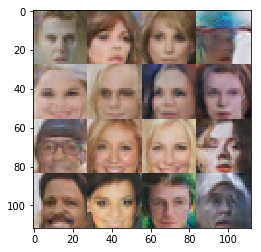

Epoch 4/5... Discriminator Loss: 1.4374... Generator Loss: 0.4915


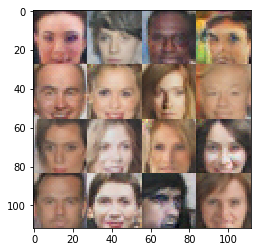

Epoch 4/5... Discriminator Loss: 1.5099... Generator Loss: 0.5182


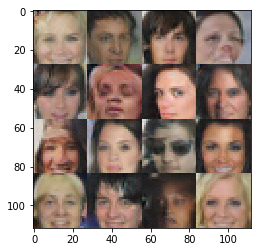

Epoch 5/5... Discriminator Loss: 1.5318... Generator Loss: 0.4158


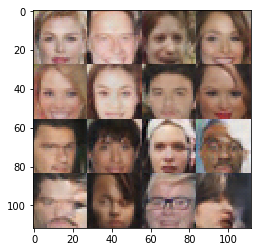

Epoch 5/5... Discriminator Loss: 1.5403... Generator Loss: 0.3967


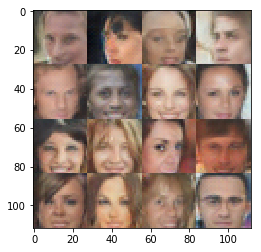

Epoch 5/5... Discriminator Loss: 1.5514... Generator Loss: 0.4873


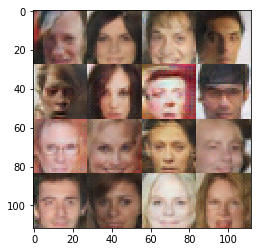

Epoch 5/5... Discriminator Loss: 1.4553... Generator Loss: 0.5295


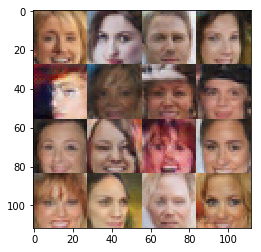

Epoch 5/5... Discriminator Loss: 1.3456... Generator Loss: 0.5183


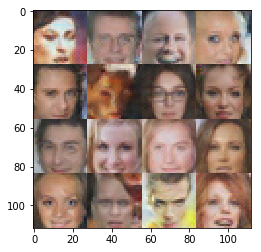

Epoch 5/5... Discriminator Loss: 1.6508... Generator Loss: 0.4109


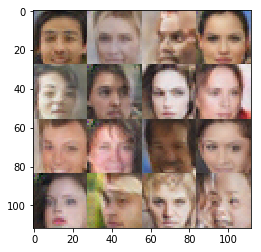

Epoch 5/5... Discriminator Loss: 1.5997... Generator Loss: 0.3783


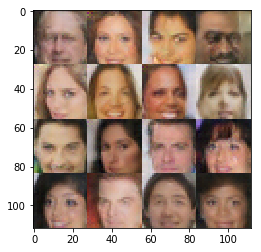

Epoch 5/5... Discriminator Loss: 1.6528... Generator Loss: 0.4058


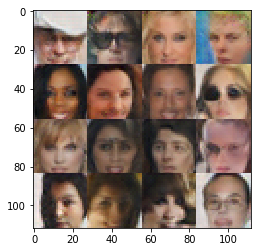

Epoch 5/5... Discriminator Loss: 1.6057... Generator Loss: 0.3736


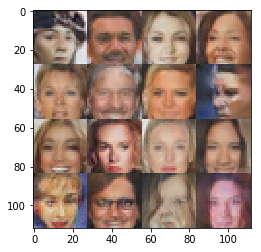

Epoch 5/5... Discriminator Loss: 1.4278... Generator Loss: 0.4827


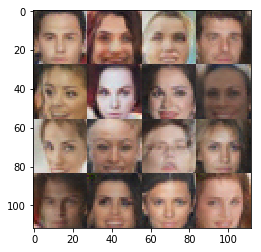

Epoch 5/5... Discriminator Loss: 1.6146... Generator Loss: 0.4051


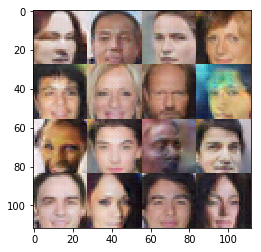

Epoch 5/5... Discriminator Loss: 1.7945... Generator Loss: 0.3131


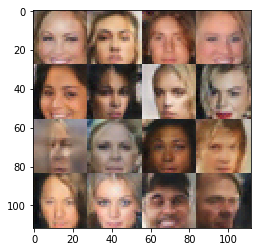

Epoch 5/5... Discriminator Loss: 1.4855... Generator Loss: 0.5654


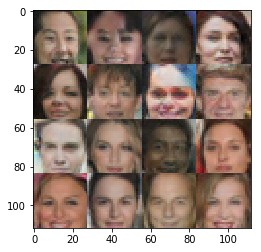

Epoch 5/5... Discriminator Loss: 1.6727... Generator Loss: 0.3589


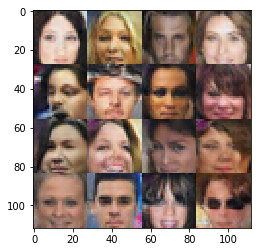

Epoch 5/5... Discriminator Loss: 1.5363... Generator Loss: 0.4437


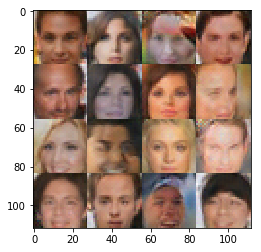

Epoch 5/5... Discriminator Loss: 1.5921... Generator Loss: 0.3863


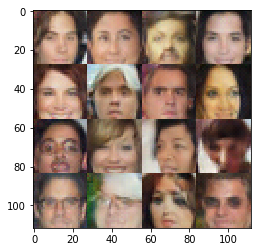

Epoch 5/5... Discriminator Loss: 1.5369... Generator Loss: 0.4797


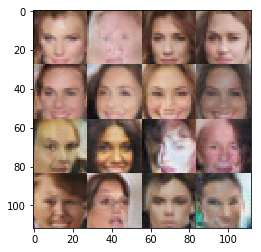

Epoch 5/5... Discriminator Loss: 1.7529... Generator Loss: 0.3320


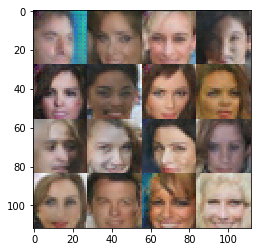

Epoch 5/5... Discriminator Loss: 1.8258... Generator Loss: 0.3248


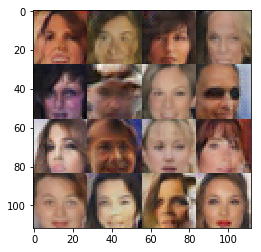

Epoch 5/5... Discriminator Loss: 1.4044... Generator Loss: 0.6266


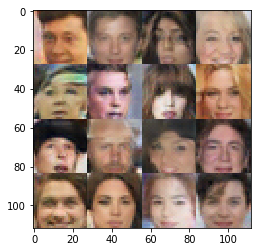

Epoch 5/5... Discriminator Loss: 1.3579... Generator Loss: 0.6103


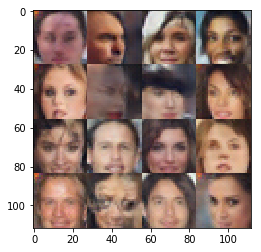

Epoch 5/5... Discriminator Loss: 1.8108... Generator Loss: 0.2851


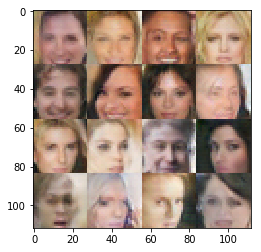

Epoch 5/5... Discriminator Loss: 1.5258... Generator Loss: 0.4224


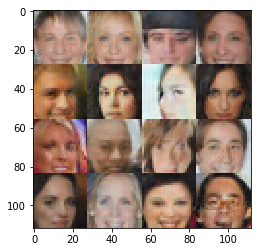

Epoch 5/5... Discriminator Loss: 1.4159... Generator Loss: 0.5353


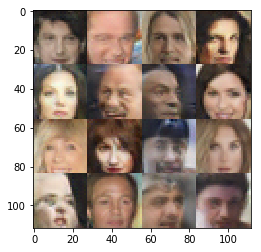

Epoch 5/5... Discriminator Loss: 1.7026... Generator Loss: 0.3444


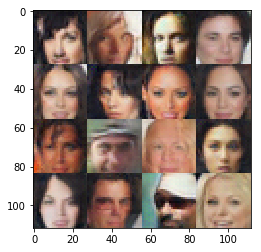

Epoch 5/5... Discriminator Loss: 1.4093... Generator Loss: 0.4562


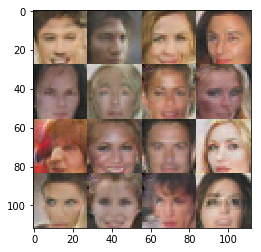

Epoch 5/5... Discriminator Loss: 1.5534... Generator Loss: 0.4471


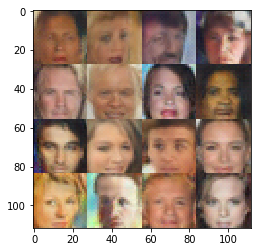

Epoch 5/5... Discriminator Loss: 1.0722... Generator Loss: 0.6910


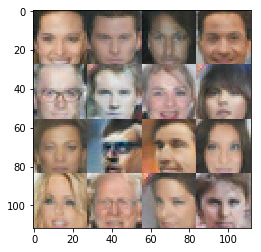

Epoch 5/5... Discriminator Loss: 0.8471... Generator Loss: 1.1678


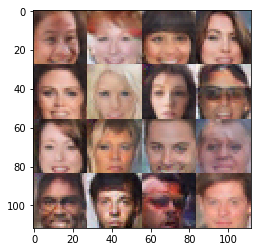

Epoch 5/5... Discriminator Loss: 1.4670... Generator Loss: 0.5890


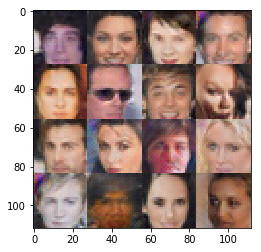

Epoch 5/5... Discriminator Loss: 2.0597... Generator Loss: 0.2890


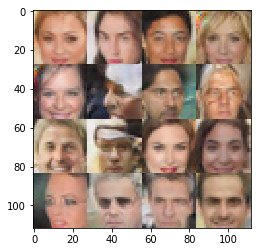

Epoch 5/5... Discriminator Loss: 1.9141... Generator Loss: 0.3073


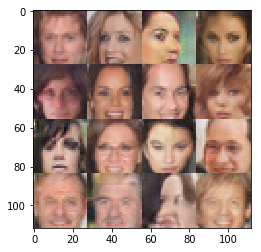

Epoch 5/5... Discriminator Loss: 1.1502... Generator Loss: 0.7407


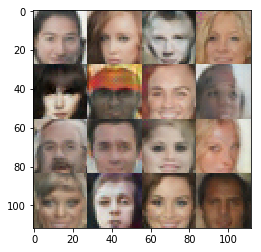

Epoch 5/5... Discriminator Loss: 1.5506... Generator Loss: 0.3703


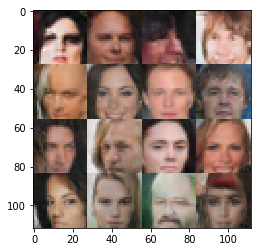

Epoch 5/5... Discriminator Loss: 1.5337... Generator Loss: 0.3691


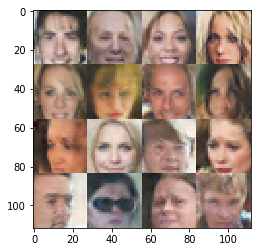

Epoch 5/5... Discriminator Loss: 1.8067... Generator Loss: 0.2990


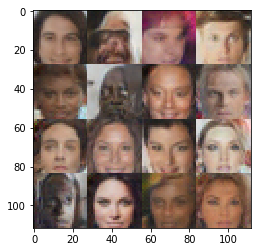

Epoch 5/5... Discriminator Loss: 1.5031... Generator Loss: 0.4630


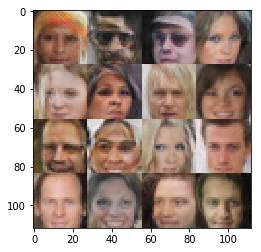

Epoch 5/5... Discriminator Loss: 1.3875... Generator Loss: 0.4748


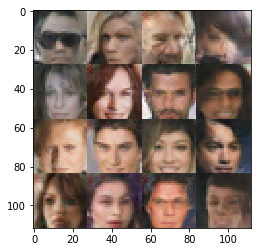

Epoch 5/5... Discriminator Loss: 1.6915... Generator Loss: 0.3781


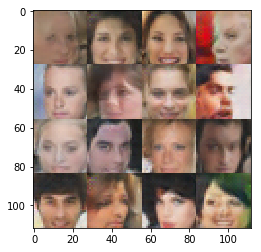

Epoch 5/5... Discriminator Loss: 1.5612... Generator Loss: 0.4225


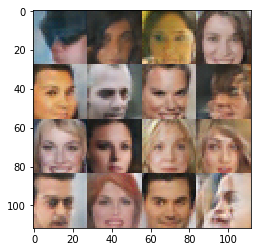

Epoch 5/5... Discriminator Loss: 1.6785... Generator Loss: 0.3543


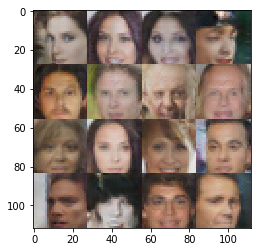

Epoch 5/5... Discriminator Loss: 1.4818... Generator Loss: 0.4568


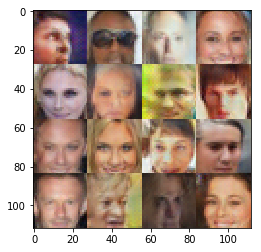

Epoch 5/5... Discriminator Loss: 1.4855... Generator Loss: 0.4734


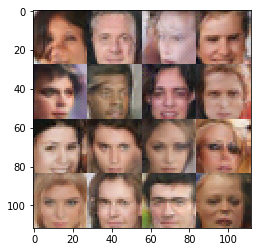

Epoch 5/5... Discriminator Loss: 1.5924... Generator Loss: 0.3772


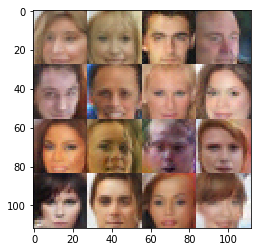

Epoch 5/5... Discriminator Loss: 1.9279... Generator Loss: 0.2580


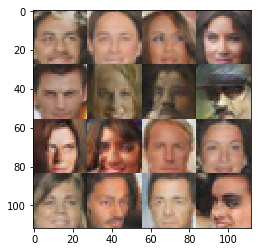

Epoch 5/5... Discriminator Loss: 1.6054... Generator Loss: 0.3955


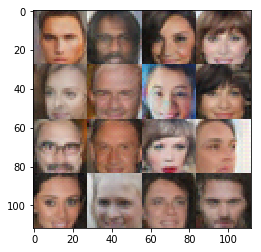

Epoch 5/5... Discriminator Loss: 1.6668... Generator Loss: 0.3736


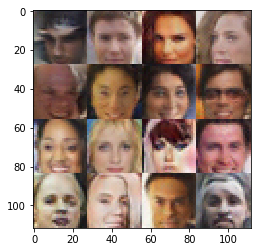

Epoch 5/5... Discriminator Loss: 1.4035... Generator Loss: 0.4574


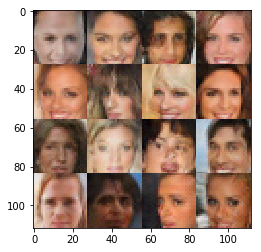

Epoch 5/5... Discriminator Loss: 1.5953... Generator Loss: 0.3985


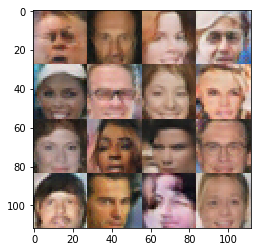

Epoch 5/5... Discriminator Loss: 1.6587... Generator Loss: 0.3932


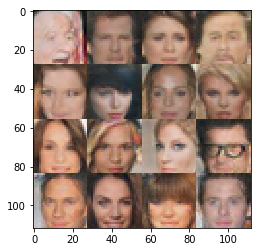

Epoch 5/5... Discriminator Loss: 1.4836... Generator Loss: 0.4571


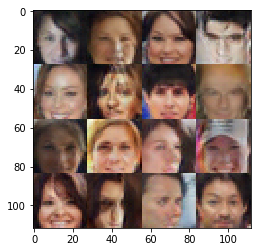

Epoch 5/5... Discriminator Loss: 1.5668... Generator Loss: 0.4274


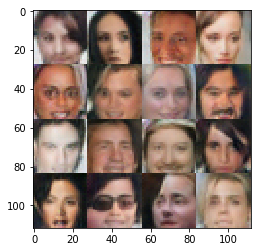

Epoch 5/5... Discriminator Loss: 1.6976... Generator Loss: 0.3621


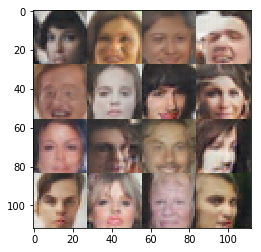

Epoch 5/5... Discriminator Loss: 1.7190... Generator Loss: 0.3537


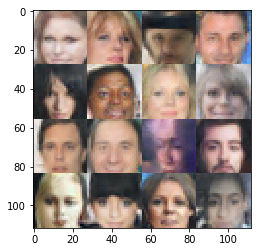

Epoch 5/5... Discriminator Loss: 1.5295... Generator Loss: 0.4142


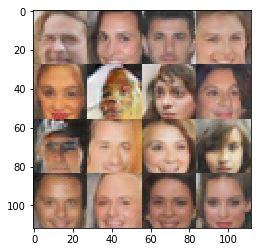

Epoch 5/5... Discriminator Loss: 1.9435... Generator Loss: 0.2671


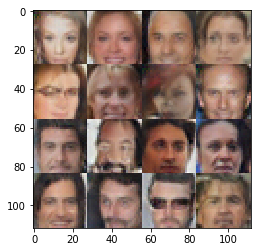

Epoch 5/5... Discriminator Loss: 1.6791... Generator Loss: 0.4092


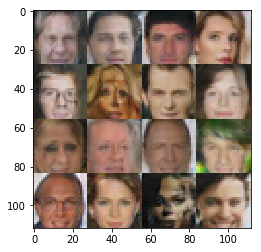

Epoch 5/5... Discriminator Loss: 1.7429... Generator Loss: 0.3306


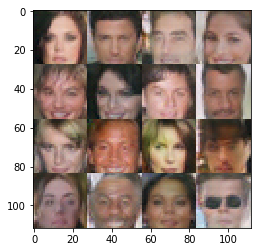

Epoch 5/5... Discriminator Loss: 2.0286... Generator Loss: 0.2414


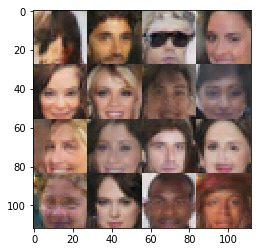

Epoch 5/5... Discriminator Loss: 1.3837... Generator Loss: 0.5109


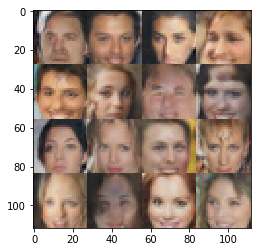

Epoch 5/5... Discriminator Loss: 1.3794... Generator Loss: 0.4946


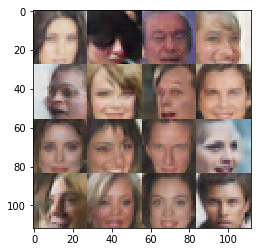

Epoch 5/5... Discriminator Loss: 1.1815... Generator Loss: 0.5879


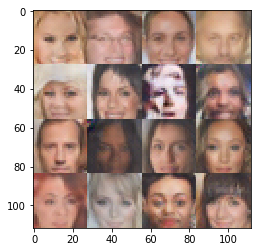

Epoch 5/5... Discriminator Loss: 1.4809... Generator Loss: 0.4007


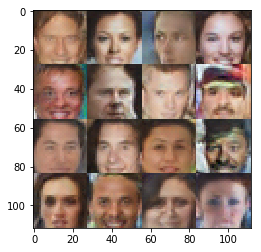

In [13]:
batch_size = 64
z_dim = 128
learning_rate = 0.001
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 5

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.